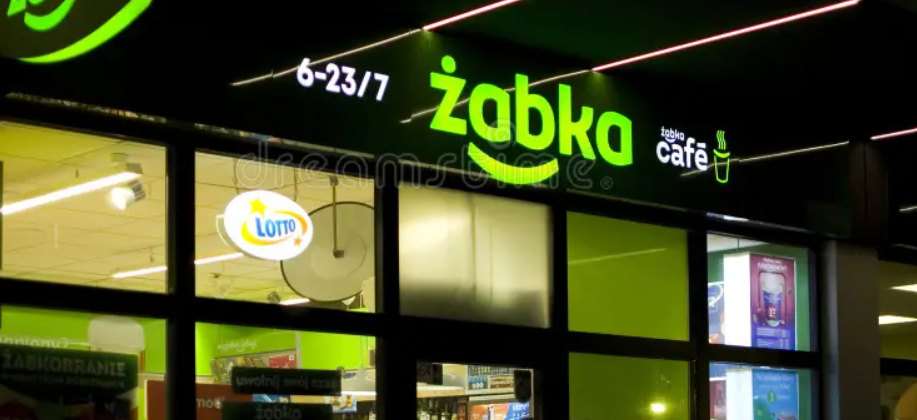

<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

  <h1 style="color: #388e3c; font-size: 24px; text-align: center; font-weight: bold;">
    🐸Strategic Analysis of Żabka Store Locations in Warsaw
  </h1>
  
  <p>This project will use location and social data to figure out the best places for Żabka stores in Warsaw. By looking at maps and information about people, we want to find the best spots for new stores.</p>

  <h2 style="color: #757575; font-size: 22px; font-weight: bold;">Collecting Data</h2>
  <p>We’ll gather location data for Żabka stores and add important details like:</p>
  <ul style="margin-left: 20px;">
    <li>Average income</li>
    <li>How crowded the area is</li>
    <li>How much people spend</li>
    <li>Family details</li>
    <li>Unemployment rate</li>
    <li>New developers investments</li>
  </ul>

  <h2 style="color: #757575; font-size: 22px; font-weight: bold;">Looking at the Area</h2>
  <p>We’ll check how close Żabka stores are to other businesses and see what’s around within nearest neighbourhood to understand the competition.</p>

  <h2 style="color: #757575; font-size: 22px; font-weight: bold;">Grouping and Predicting</h2>
  <p>We’ll use clustering to group zabkas based on different conditions. This will help us decide which locations are best.</p>

  <h2 style="color: #757575; font-size: 22px; font-weight: bold;">Outcome</h2>
  <p>Our study will show the best spots for Żabka stores in Warsaw, helping with decisions about where to open or expand.</p>

</div>


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575;">1. Packages Installation</span>
</div>


In [ ]:
! pip install tqdm
!pip install folium
!pip install geopy

In [3]:


# Geolocation and mapping libraries
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
import folium
import requests  # For handling HTTP requests
from bs4 import BeautifulSoup  # For parsing HTML and XML

# Data manipulation and analysis
import numpy as np
import pandas as pd
from pandas import json_normalize
import json  # Handling JSON files

# Machine learning libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
import plotly.express as px

# Utility libraries
from tqdm import tqdm  # Progress bar
import ipywidgets as widgets
from IPython.display import display

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print('Libraries imported.')


Libraries imported.


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575;">2. Data Loading</span>
</div>


In [4]:
# Load the dataset
df1 = pd.read_csv('zabka_shops.csv')

# Filter the DataFrame for rows where the 'city' column is 'Warszawa'
df2 = df1[df1['city'] == 'Warszawa']

# Display the first few rows of the filtered DataFrame
df2.head()


,id,slug,openTime,closeTime,city,address,postcode,voivodeship,county,community,region,salesRegion,openTimeSeconds,closeTimeSeconds,lat,lng,services
3,ID06264,"ID06264,warszawa-ul-zeganska-18",06:00,23:00,Warszawa,ul. Żegańska 18,04-713,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.4.1,21600.0,82800.0,52.205620,21.172909,"BIH,DEN,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC"
5,ID08105,"ID08105,warszawa-zelazna-67-16",06:00,23:00,Warszawa,Żelazna 67/16,00-871,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.6.1,21600.0,82800.0,52.235723,20.989872,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC"
14,ID08770,"ID08770,warszawa-romera-4b",06:00,23:00,Warszawa,Romera 4b,02-784,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.5.5,21600.0,82800.0,52.155407,21.029269,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC"
18,ID05070,"ID05070,warszawa-rakowiecka-33-lok-u32",06:00,23:00,Warszawa,Rakowiecka 33 lok. U32,02-519,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.5.6,21600.0,82800.0,52.208317,21.012640,"BIH,DEN,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC"
25,ID06566,"ID06566,warszawa-ul-lekka-3-lok-u9",06:00,23:00,Warszawa,ul. Lekka 3 lok. U9,01-910,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.2.4,21600.0,82800.0,52.285133,20.927041,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC"




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575;">3. Interactive Map of Żabka Stores in Warsaw</span>
</div>



<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

  <p>The following code uses the <strong>Folium</strong> library to create an interactive map showing the locations of <strong>Żabka</strong> stores in Warsaw. Each store is marked with a circle, making it easy to see where they are in the city.</p>

  <p><strong>Map Features:</strong></p>
  <ul style="margin-left: 20px; list-style-type: none; padding: 0;">
    <li><strong>Location Markers:</strong> Each marker is placed exactly where the store is located.</li>
    <li><strong>Popups with Info:</strong> Click on a marker to see the store’s address and services.</li>
    <li><strong>Zoom In & Out:</strong> Explore the map by zooming in and out to see more details.</li>
  </ul>

  <p>This map is a handy tool for customers looking for Żabka stores nearby. It also gives a clear view of how stores are spread across Warsaw, which is useful for planning new locations.</p>

</div>


In [29]:
# Setting the coordinates for Warsaw
warszawa_lat = 52.2297
warszawa_lng = 21.0122

# Creating a map of Warsaw
map_warsaw = folium.Map(location=[warszawa_lat, warszawa_lng], zoom_start=12)

# Adding markers for each Żabka store
for lat, lng, address, services in zip(df2['lat'], df2['lng'], df2['address'], df2['services']):
    label = f'{address}, Services: {services}'
    folium.CircleMarker(
        [lat, lng],
        radius=6,
        popup=folium.Popup(label, parse_html=True),
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7
    ).add_to(map_warsaw)

# Displaying the map
map_warsaw


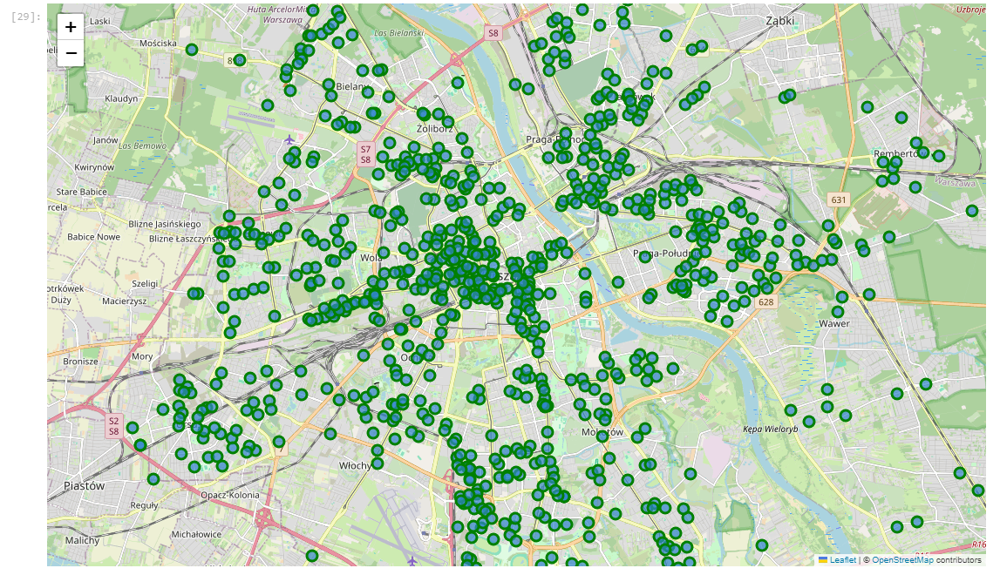


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575;">4. Loading closest venues to zabka</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

  <p>This code helps improve the analysis of <strong>Żabka</strong> store locations by gathering data on nearby places using the <strong>Foursquare API</strong>. It provides useful information about local businesses and attractions, giving a better understanding of the surrounding area.</p>

  <p><strong>Key benefits of this data collection:</strong></p>
  <ul style="margin-left: 20px; list-style-type: none; padding: 0;">
    <li> <strong>Local Insights:</strong> Learn about nearby places to understand the market around each Żabka store.</li>
    <li> <strong>Competitive Analysis:</strong> Gather information on local businesses to spot potential competitors and customer trends.</li>
    <li><strong>Strategic Planning:</strong> Use the data to make better decisions on where to open new stores or potential partnerships.</li>
  </ul>

  <p>By combining this data with Żabka store locations, businesses can make smarter decisions about operations and marketing, helping them grow and stay competitive in the market.</p>

</div>



In [30]:

# Defining Foursquare credentials and version
CLIENT_ID = 'LWVZPZPRFKHADHOBEH1INYBDP4RYFBUWVHPEMGPGGUY2LW54'  # Your Foursquare ID(example id)
CLIENT_SECRET = 'GWPPJ55MMV3JZPOQFFE15BJA1RVMHOGAI5GWWIIHR0MZMKCT'  # Your Foursquare Secret(example secret)
VERSION = '20180605'  # Foursquare API version
LIMIT = 30  # Maximum number of places returned by Foursquare API
radius = 500  # Define radius

# List to store results
all_venues = []

# Iterating through each store in df2 with a progress bar
for index, row in tqdm(df2.iterrows(), total=df2.shape[0], desc='Fetching data from Foursquare'):
    neighborhood_latitude = row['lat']  # Latitude
    neighborhood_longitude = row['lng']  # Longitude
    address = row['address']  # Store address

    # Creating URL for the request
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        neighborhood_latitude,
        neighborhood_longitude,
        radius,
        LIMIT
    )

    # Performing GET request and retrieving results
    results = requests.get(url).json()

    # Checking if 'groups' is in the response
    if 'response' in results and 'groups' in results['response'] and len(results['response']['groups']) > 0:
        # Extracting data from the response
        for venue in results['response']['groups'][0]['items']:
            venue_info = venue['venue']
            venue_name = venue_info['name']
            venue_category = venue_info['categories'][0]['name'] if venue_info['categories'] else 'Unknown'  # Default to 'Unknown' if no category

            # Adding data to the list
            all_venues.append({
                'store_address': address,
                'store_lat': neighborhood_latitude,
                'store_lng': neighborhood_longitude,
                'venue_name': venue_name,
                'venue_category': venue_category,
                'venue_lat': venue_info['location']['lat'],
                'venue_lng': venue_info['location']['lng']
            })
    else:
        print(f"No data for location: {address} (lat: {neighborhood_latitude}, lng: {neighborhood_longitude})")
        # You may also add code here to save or process missing data if needed.

# Creating DataFrame from the results
venues_df = pd.DataFrame(all_venues)

# Displaying the results
venues_df.head()


Fetching data from Foursquare: 100%|█████████████████████████████████████████████████| 937/937 [05:24<00:00,  2.89it/s]


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">4.1 Most popular categories count</span>
</div>


In [32]:
# Counting unique categories and sorting by frequency
category_counts = venues_df['venue_category'].value_counts()

# Displaying the results
category_counts.head()


Coffee Shop           804
Supermarket           612
Café                  603
Italian Restaurant    505
Pizzeria              360
Name: venue_category, dtype: int64

<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

  <p><strong>This analysis looks at nearby venues</strong> to understand key categories for Żabka. Some categories, such as supermarkets, convenience stores, grocery stores, fast food restaurants, bakeries, and ice cream parlors, directly compete with Żabka. Complementary categories like coffee shops, cafés, bus stations, and hotels can bring more foot traffic. These places can help Żabka attract customers who are looking for quick shopping options.</p>

  <p><strong>By positioning stores near these complementary venues</strong>, Żabka can increase foot traffic and boost sales. Understanding the competitive landscape helps Żabka identify potential threats. This insight also allows Żabka to explore collaboration opportunities and make better decisions about store locations and marketing strategies.</p>

</div>



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">4.2 Grouping categories</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

  <p>This code snippet is designed to simplify venue categories in the <strong>venues_df</strong> DataFrame by grouping specific categories into broader classifications. This process enhances data analysis by reducing complexity and facilitating better insights.</p>

  <p>Key objectives of this simplification include:</p>
  <ul style="margin-left: 20px;">
    <li><strong>Data Simplification:</strong> Consolidating similar venue types into broader categories, such as grouping coffee shops and bakeries under <strong>Coffee & Baking</strong>.</li>
    <li><strong>Improved Analysis:</strong> Enabling easier comparisons and insights into local business trends by reducing the number of categories.</li>
    <li><strong>Handling Outliers:</strong> Categories not defined in the function are set to <strong>None</strong>, allowing for the identification of less common venues.</li>
  </ul>

  <p>By applying this categorization logic, businesses can derive actionable insights, guiding strategic decisions and marketing efforts based on a clearer understanding of the local competitive landscape.</p>

</div>


In [33]:

# Function to simplify categories into new categories
def simplify_category(category):
    # Coffee & Baking Categories
    if category in ['Coffee Shop', 'Café', 'Bakery', 'Ice Cream Parlor', 'Dessert Shop']:
        return 'Coffee & Baking'  # Change to Coffee & Baking
    
    # Bar & Juice Categories
    elif category in ['Beer Bar', 'Cocktail Bar', 'Wine Bar', 'Bar', 'Bubble Tea Shop', 'Juice Bar']:
        return 'Bar & Juice'
    
    # Various Restaurants Categories
    elif category in ['Restaurant', 'Polish Restaurant', 'Italian Restaurant', 'Chinese Restaurant', 
                      'Indian Restaurant', 'Sushi Restaurant', 'Burger Joint', 'Fast Food Restaurant', 
                      'Pizzeria', 'Kebab Restaurant', 'Vegan and Vegetarian Restaurant', 'Thai Restaurant', 
                      'Mexican Restaurant', 'Greek Restaurant', 'Middle Eastern Restaurant', 'French Restaurant', 
                      'Spanish Restaurant', 'German Restaurant', 'American Restaurant', 'Vietnamese Restaurant', 
                      'Turkish Restaurant', 'Eastern European Restaurant', 'Modern European Restaurant', 
                      'Gastropub', 'Bistro', 'Food Court', 'Dinner']:
        return 'Various Restaurants'

    # Retail Categories
    elif category in ['Food and Beverage Retail', 'Retail']:
        return 'Retail'
    
    # Grocery & Fresh Food
    elif category in ['Grocery Store', 'Farmers Market']:
        return 'Grocery & Fresh Food'

    # Supermarket and Related Categories
    elif category in ['Supermarket', 'Convenience Store']:
        return category  # Keep categories unchanged
    
    # Transport Categories
    elif category in ['Bus Station', 'Rail Station', 'Metro Station', 'Bus Stop']:
        return 'Transport'
    

    
    # Cultural Venues
    elif category in ['Museum', 'Art Museum', 'Science Museum', 'History Museum', 'Art Gallery', 
                      'Cultural Center', 'Concert Hall', 'Theater', 'Opera House', 'Comedy Club', 
                      'Jazz and Blues Venue']:
        return 'Cultural Venues'
    
    # Shopping Venues
    elif category in ['Shopping Mall', 'Electronics Store', 'Department Store', 'Clothing Store', 
                      'Gift Store', 'Furniture and Home Store', 'Bookstore', 'Vintage and Thrift Store', 
                      'Jewelry Store', 'Cosmetics Store', 'Perfume Store', 'Hardware Store', 
                      'Mobile Phone Store', 'Gourmet Store']:
        return 'Shopping Venues'
    
    # Health & Wellness
    elif category in ['Pharmacy', 'Drugstore', 'Spa', 'Gym and Studio', 'Fitness Center']:
        return 'Health & Wellness'
    
    # Entertainment Venues
    elif category in ['Movie Theater', 'Indie Movie Theater', 'Bowling Alley', 'Arcade', 'Amusement Park', 
                      'Night Club', 'Music Venue', 'Sports Bar', 'Dance Studio']:
        return 'Entertainment Club Venues'
    
    # Accommodation
    elif category in ['Hotel', 'Bed and Breakfast', 'Hostel', 'Motel']:
        return 'Accommodation'
    
    # Outdoor & Recreation
    elif category in ['Skating Rink', 'Plaza','Beach', 'Park', 'Lake', 'Forest', 'Scenic Lookout', 'Water Park', 'Hiking Trail', 'Outdoor Sculpture', 'Playground', 'Skate Park', 'Stawy']:
        return 'Outdoor & Recreation'

    # Leave other categories as NaN or set them to 'Other'
    return None  # or return 'Other' if you want to group other categories

# Apply the function to create a new column for simplified categories
venues_df['loc_category'] = venues_df['venue_category'].apply(simplify_category)

# Drop the old category column
#venues_df = venues_df.drop(columns=['new_category'])

# Displaying the results
venues_df.head()


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants


In [38]:
# Counting unique categories and sorting by frequency
category_counts = venues_df['loc_category'].value_counts()

# Displaying the results
category_counts


Various Restaurants          3440
Coffee & Baking              1975
Supermarket                   612
Outdoor & Recreation          569
Shopping Venues               543
Transport                     493
Bar & Juice                   458
Accommodation                 436
Grocery & Fresh Food          281
Cultural Venues               277
Entertainment Club Venues     232
Health & Wellness             179
Convenience Store             144
Retail                        135
Name: loc_category, dtype: int64


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">5.K-means clustering-basic</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;"> <p>This step involves clustering Żabka store locations based on the types of nearby venues. </p> <p>Key steps in this process include:</p> <ul style="margin-left: 20px;"> <li><strong>One-Hot Encoding:</strong> Transforming venue categories like <strong>Coffee & Baking</strong> and <strong>Various Restaurants</strong> into binary columns for each store location.</li> <li><strong>Grouping Data:</strong> Aggregating venue data by store address to count the number of venues in each category for every store.</li> <li><strong>Clustering with K-Means:</strong> Applying K-Means clustering to group store locations based on the venue profiles around them, which reveals patterns and similarities among stores.</li> </ul> <p>These clusters provide insights into the competitive landscape and local business environment around Żabka stores, supporting strategic decision-making.</p> </div>

In [39]:

# Step 1: Data Preparation

# 1. One-Hot encoding for venue categories
venues_onehot = pd.get_dummies(venues_df[['loc_category']], prefix="", prefix_sep="")

# 2. Adding the column with addresses
venues_onehot['store_address'] = venues_df['store_address']

# 3. Moving the address column to the first position
fixed_columns = [venues_onehot.columns[-1]] + list(venues_onehot.columns[:-1])
venues_onehot = venues_onehot[fixed_columns]

# 4. Grouping by store address and counting occurrences
counted_venues = venues_onehot.groupby('store_address').sum().reset_index()

# Step 2: K-means Clustering

# Setting the number of clusters
kclusters = 4  # You can change this value to adjust the number of clusters

# Dropping the address column before clustering
counted_venues_clustering = counted_venues.drop('store_address', axis=1)

# Running K-means
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(counted_venues_clustering)

# Checking cluster labels
counted_venues['cluster'] = kmeans.labels_  # Renaming the column to "cluster"

# Step 3: Merging Results

# Adding locations for each address
locations = venues_df[['store_address', 'store_lat', 'store_lng']].drop_duplicates()
merged_results = counted_venues.merge(locations, on='store_address', how='left')

# Adding the cluster column to the original DataFrame
venues_df = venues_df.merge(counted_venues[['store_address', 'cluster']], on='store_address', how='left')  # Renaming the column

# Creating the map
map_clusters = folium.Map(location=[52.2297, 21.0122], zoom_start=11)  # Warsaw

# Setting cluster colors
cluster_colors = ['green', 'yellow', 'orange', 'darkgreen']  # Custom colors

# Adding markers to the map
for lat, lon, poi, cluster in zip(merged_results['store_lat'], merged_results['store_lng'], merged_results['store_address'], merged_results['cluster']):
    label = folium.Popup(str(poi) + ' cluster ' + str(cluster), parse_html=True)  # Changing label to "cluster"
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=cluster_colors[cluster],
        fill=True,
        fill_color=cluster_colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)

# Displaying the map
map_clusters


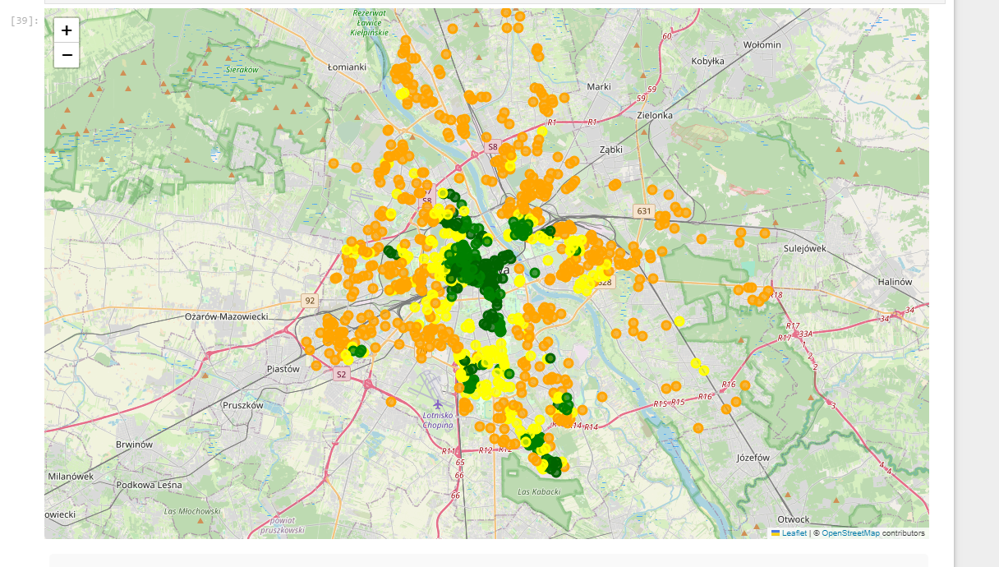


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">5.1 Number of venue in each cluster-summary</span>
</div>


In [40]:
# 1. Group by cluster
cluster_summary = venues_df.groupby('cluster').agg({
    'loc_category': ['count', lambda x: x.mode()[0]]  # Number of venues and the most frequent category
}).reset_index()

# 2. Renaming columns for clarity
cluster_summary.columns = ['cluster', 'num_venues', 'most_common_venue']

# 3. Displaying cluster summary
print(cluster_summary)


   cluster  num_venues    most_common_venue
0        0        2778  Various Restaurants
1        1        2431  Various Restaurants
2        2        2351  Various Restaurants
3        3        2214      Coffee & Baking


In [41]:
# 1. Group by cluster and categories
cluster_detail = venues_df.groupby(['cluster', 'loc_category']).size().unstack(fill_value=0)

# 2. Displaying detailed information about categories within clusters as a DataFrame
cluster_detail


loc_category,Accommodation,Bar & Juice,Coffee & Baking,Convenience Store,Cultural Venues,Entertainment Club Venues,Grocery & Fresh Food,Health & Wellness,Outdoor & Recreation,Retail,Shopping Venues,Supermarket,Transport,Various Restaurants
cluster,,,,,,,,,,,,,,
0,159,141,573,23,91,48,39,28,120,2,100,70,35,1349
1,71,67,434,41,64,68,67,72,124,19,155,184,123,942
2,92,24,277,74,26,57,150,70,220,103,138,318,324,478
3,114,226,691,6,96,59,25,9,105,11,150,40,11,671


In [42]:
# 1. Group by cluster and categories
cluster_detail = venues_df.groupby(['cluster', 'venue_category']).size().unstack(fill_value=0)

# 2. Displaying detailed information about categories within clusters as a DataFrame
cluster_detail


venue_category,Advertising Agency,African Restaurant,American Restaurant,Amphitheater,Amusement Park,Antique Store,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts and Crafts Store,Arts and Entertainment,Asian Restaurant,Attraction,Automotive Repair Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Beach,Beach Bar,Bed and Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bicycle Store,Big Box Store,Bike Rental,Bistro,Board Store,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Breakfast Spot,Brewery,Bridal Store,Bubble Tea Shop,Buffet,Bulgarian Restaurant,Burger Joint,Burrito Restaurant,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Caucasian Restaurant,Cemetery,Children's Clothing Store,Chinese Restaurant,Chocolate Store,Church,Circus,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Library,College Theater,Comedy Club,Concert Hall,Construction,Convenience Store,Cosmetics Store,Creperie,Cultural Center,Cupcake Shop,Dairy Store,Dance Studio,Deli,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Park,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Event Space,Exhibit,Eyecare Store,Falafel Restaurant,Farmers Market,Fashion Accessories Store,Fast Food Restaurant,Flea Market,Flower Store,Food Court,Food Stand,Food Truck,Food and Beverage Retail,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit and Vegetable Store,Fuel Station,Furniture and Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,German Restaurant,Gift Store,Go Kart Track,Gourmet Store,Greek Restaurant,Grocery Store,Gym Pool,Gym and Studio,Harbor or Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Hiking Trail,Historic and Protected Site,History Museum,Hobby Store,Home Appliance Store,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hungarian Restaurant,Ice Cream Parlor,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz and Blues Venue,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Korean BBQ Restaurant,Korean Restaurant,Kosher Restaurant,Lake,Landmarks and Outdoors,Lebanese Restaurant,Light Rail Station,Liquor Store,Lottery Retailer,Lounge,Mac and Cheese Joint,Market,Massage Clinic,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Store,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument,Moroccan Restaurant,Motel,Motorcycle Dealership,Mountain,Movie Theater,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Night Club,Night Market,Noodle Restaurant,Office,Office Supply Store,Opera House,Other Great Outdoors,Outdoor Sculpture,Outlet Mall,Outlet Store,Paella Restaurant,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Store,Peruvian Restaurant,Pet Supplies Store,Pharmacy,Pier,Pizzeria,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool Hall,Port,Print Store,Pub,Public Art,Publisher,RV Park,Rail Station,Ramen Restaurant,Rental Car Location,Restaurant,Retail,River,Road,Rock Club,Russian Restaurant,Sake Bar,Salad Restaurant,Sandwich Spot,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Stadium,South Indian Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Retail,Sports Bar,Sports and Recreation,Stable,Stadium,Steakhouse,Structure,Supermarket,Sushi Restaurant,Swimming Pool,Taco Restaurant,Tapas Restaurant,Tattoo Parlor,Taxi Stand,Tea Room,Tech Startup,Tennis Stadium,Thai Restaurant,Theater,Tibetan Restaurant,Tiki Bar,Tourist Informat


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">5.2 Cluster details-summary</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">

<p><strong>Cluster 0 (Strict City Center) Characteristics:</strong> Cluster 0 is located in the heart of Warsaw, with a dense concentration of restaurants , bars and coffee & baking venues , making it a vibrant area for food, leisure, and nightlife. It also boasts cultural venues  and shopping venues , catering to both tourists and busy city dwellers. The strong presence of supermarkets and grocery stores  ensures convenient access to daily necessities.</p>

<p><strong>Cluster 3 (Intermediate Area between City Center and Outskirts) Characteristics:</strong> Cluster 3 is a transitional area offering a balance between commercial and residential needs. It has a good mix of supermarkets , shopping venues , and various restaurants , appealing to both residents and occasional visitors. The area also features health & wellness facilities  and transport hubs , enhancing its accessibility and appeal for daily living and convenience.</p>

<p><strong>Cluster 2 (Outer Residential Areas, Beyond Vistula and Surrounding Districts) Characteristics:</strong> Cluster 2 represents more residential areas and suburban zones, including the regions beyond the Vistula River. It has a solid presence of supermarkets  and grocery stores, . The area also offers outdoor & recreation  options, indicating a more family-friendly, nature-oriented environment with an emphasis on fresh food  and wellness.</p>

<p><strong>Cluster 1 (Farther Residential Areas and Expanding Districts) Characteristics:</strong> Cluster 1, being farther from the city center, has a more relaxed atmosphere with a high concentration of cultural venues  and various restaurants .  It focuses more on accommodation and other residential services.</p>

</div>



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">6. Distance between Zabka and nearest venue from Foodshopping category</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
<p><strong>Distance Between Żabka Stores and Nearby Venues:</strong> The analysis aims to understand the proximity of Żabka stores to various establishments categorized as Supermarkets, Grocery Stores, Convenience Stores, Farmers Markets, Food and Beverage Retail, and Retail. By calculating the distance to the nearest venue within these categories, we can assess the accessibility of essential services and amenities for the community.</p>

<p><strong>Purpose of the Distance Calculation:</strong> This metric serves to highlight how conveniently residents can access additional shopping options beyond Żabka. A shorter distance to nearby venues may enhance the overall convenience for customers, allowing them to meet their grocery and shopping needs with ease. Furthermore, understanding these distances can inform urban planning and help identify areas that may benefit from additional retail offerings.</p>

<p><strong>Potential Benefits:</strong> By analyzing these distances, local businesses can identify strategic locations for potential expansion or partnerships. Additionally, this information can support community initiatives aimed at improving access to essential services, thereby fostering a more connected and vibrant neighborhood.</p>

<p><strong>Conclusion:</strong> Evaluating the distance between Żabka stores and the nearest venues within selected categories offers valuable insights into community accessibility. It underscores the importance of location in enhancing the shopping experience for residents, promoting convenience, and supporting local businesses.</p>
</div>


In [43]:

# Function to calculate distance
def calculate_distance(coord1, coord2):
    return geodesic(coord1, coord2).kilometers

# Step 1: Filtering venues by category
categories = ['Supermarket', 'Grocery Store', 'Convenience Store', 'Farmers Market', 'Food and Beverage Retail', 'Retail']

# Filtering only selected categories
filtered_venues = venues_df[venues_df['venue_category'].isin(categories)]

# Step 2: Calculating the distance between each Żabka store and the nearest venues from the selected categories
def find_nearest_venues(store_lat, store_lng, filtered_venues):
    distances = []
    for _, row in filtered_venues.iterrows():
        venue_coords = (row['venue_lat'], row['venue_lng'])
        store_coords = (store_lat, store_lng)
        distance = calculate_distance(store_coords, venue_coords)
        distances.append((row['venue_name'], distance))
    # Sort by distance and return the nearest venue
    nearest_venue = min(distances, key=lambda x: x[1])
    return nearest_venue

# Example: calculating the nearest venue for each Żabka store
zabka_distances = []
for i, row in tqdm(venues_df.iterrows(), total=venues_df.shape[0], desc="Calculating nearest venues"):  # Added progress bar
    nearest_venue = find_nearest_venues(row['store_lat'], row['store_lng'], filtered_venues)
    zabka_distances.append(nearest_venue)

# Adding nearest venue information to the dataframe
venues_df['nearest_venue_name'], venues_df['nearest_venue_distance_km'] = zip(*zabka_distances)




Calculating nearest venues: 100%|██████████████████████████████████████████████| 12759/12759 [1:21:47<00:00,  2.60it/s]


In [44]:
venues_df.head()

,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">7. Distance between Zabka and nearest Zabka</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
<p><strong>Distance Analysis Between Żabka Stores:</strong> Examining the distance between Żabka locations is crucial for understanding market dynamics, particularly the phenomenon of cannibalization. Cannibalization occurs when a new store opens in proximity to an existing one, potentially diverting customers from the original location rather than attracting new ones. This analysis aims to assess the impact of store placement on overall sales and customer behavior.</p>

<p><strong>Importance of the Distance Calculation:</strong> By measuring the distance to the nearest Żabka store, we can identify areas where the concentration of stores may be too high, leading to competitive overlap. This insight allows management to make informed decisions about future store openings, ensuring that each location can thrive without negatively affecting the others. Understanding these distances helps optimize store placement and enhance overall business performance.</p>

<p><strong>Strategic Planning Benefits:</strong> Analyzing distances between stores aids in strategic planning, enabling the company to assess potential risks associated with new store openings. By identifying existing market saturation, Żabka can focus on underserved areas, ultimately maximizing market reach while minimizing the risk of cannibalization. This approach supports sustainable growth and enhances the brand’s competitive positioning.<rs.</p>
</div>


In [6]:

# Function to calculate distance
def calculate_distance(coord1, coord2):
    return geodesic(coord1, coord2).kilometers

# Function to find the nearest Żabka store
def find_nearest_zabka(current_coords, zabki_df):
    zabka_distances = []
    for _, row in zabki_df.iterrows():
        current_zabka_coords = (row['lat'], row['lng'])
        # Exclude the current location
        if current_coords != current_zabka_coords:
            distance = calculate_distance(current_coords, current_zabka_coords)
            zabka_distances.append(distance)
    return min(zabka_distances) if zabka_distances else None

# Calculating distance for each point in df2
df2['nearest_zabka_distance_km'] = None
for i, row in tqdm(df2.iterrows(), total=df2.shape[0], desc="Calculating nearest Zabka distances"):
    current_coords = (row['lat'], row['lng'])
    df2.at[i, 'nearest_zabka_distance_km'] = find_nearest_zabka(current_coords, df2)

# Displaying the results
#print(df2[['address', 'nearest_zabka_distance_km']])


C:\Users\weron\AppData\Local\Temp\ipykernel_24416\2546501134.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['nearest_zabka_distance_km'] = None
Calculating nearest Zabka distances: 100%|███████████████████████████████████████████| 937/937 [02:06<00:00,  7.42it/s]



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">8.Downloading district name for each Zabka location</span>
</div>

In [22]:
# Initialize the geocoder (using Nominatim - OpenStreetMap)
geolocator = Nominatim(user_agent="zabka_locator")

# Function to find the district based on coordinates
def get_district(lat, lng):
    try:
        location = geolocator.reverse((lat, lng), exactly_one=True, timeout=10)
        address = location.raw.get('address', {})
        # Get the district (suburb) from the address
        district = address.get('suburb', 'Unknown')
        return district
    except Exception as e:
        return 'Unknown'

# Add a 'district' column with the name of the district based on df2
tqdm.pandas(desc="Finding district for each location in df2")
df2['district'] = df2.progress_apply(lambda row: get_district(row['lat'], row['lng']), axis=1)


Finding district for each location in df2: 100%|█████████████████████████████████████| 937/937 [15:36<00:00,  1.00it/s]


In [36]:
df2 = df2.rename(columns={'address': 'store_address'})

df2.head()

,id,slug,openTime,closeTime,city,store_address,postcode,voivodeship,county,community,region,salesRegion,openTimeSeconds,closeTimeSeconds,lat,lng,services,nearest_zabka_distance_km,district
3,ID06264,"ID06264,warszawa-ul-zeganska-18",06:00,23:00,Warszawa,ul. Żegańska 18,04-713,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.4.1,21600.0,82800.0,52.205620,21.172909,"BIH,DEN,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC",0.795036,Wawer
5,ID08105,"ID08105,warszawa-zelazna-67-16",06:00,23:00,Warszawa,Żelazna 67/16,00-871,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.6.1,21600.0,82800.0,52.235723,20.989872,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC",0.176614,Wola
14,ID08770,"ID08770,warszawa-romera-4b",06:00,23:00,Warszawa,Romera 4b,02-784,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.5.5,21600.0,82800.0,52.155407,21.029269,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC",0.194642,Ursynów
18,ID05070,"ID05070,warszawa-rakowiecka-33-lok-u32",06:00,23:00,Warszawa,Rakowiecka 33 lok. U32,02-519,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.5.6,21600.0,82800.0,52.208317,21.012640,"BIH,DEN,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC",0.212786,Mokotów
25,ID06566,"ID06566,warszawa-ul-lekka-3-lok-u9",06:00,23:00,Warszawa,ul. Lekka 3 lok. U9,01-910,Mazowieckie,Warszawa,"WARSZAWA (GMINA MIEJSKA, MIAST",DS5,PS5.2.4,21600.0,82800.0,52.285133,20.927041,"BIH,DEN,DKM,GSM,KPO,LOT,ODP,PAC,RAC,REJ,TER,ZBC",0.119992,Bielany


In [48]:
# Merge venues_df with df2 including both 'district' and 'nearest_zabka_distance_km'
venues_df = venues_df.merge(df2[['store_address', 'district', 'nearest_zabka_distance_km']], on='store_address', how='left')

# Display the first few rows of the merged DataFrame
venues_df.head()


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,district,nearest_zabka_distance_km
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,Wawer,0.795036
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,Wawer,0.795036
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,Wawer,0.795036
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,Wawer,0.795036
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,Wawer,0.795036


In [49]:
#Save to  CSV
venues_df.to_csv('venues_data.csv', index=False)


In [26]:

# Load the CSV file into a DataFrame
venues_df = pd.read_csv('venues_data.csv')

# Display the first few rows of the DataFrame to confirm it loaded correctly
venues_df.head()


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,district
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">9.Downloading demografy data</span>
</div>

In [30]:

# CSV file-my own reseraches
demografia = pd.read_csv("demografia.csv", encoding='cp1250')

demografia.head()


,District,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments
0,Bemowo,"9 428,12",1900,0.40,0.032,6000,0.20
1,Bia?o??ka,"8 756,45",1800,0.45,0.030,2500,0.35
2,Bielany,"9 719,12",1900,0.42,0.031,6800,0.15
3,Mokotów,"10 499,10",2000,0.30,0.028,7500,0.10
4,Ochota,"9 250,67",1950,0.28,0.035,10000,0.05


In [31]:
# Create a map with incorrect names as keys and correct names as values
district_mapping = {
    'Bia?o??ka': 'Białołęka',
    'Praga-Po?udnie': 'Praga-Południe',
    'Praga-Pó?noc': 'Praga-Północ',
    '?ródmie?cie': 'Śródmieście',
    'Weso?a': 'Wesoła',
    'W?ochy': 'Włochy',
    '?oliborz': 'Żoliborz'
}

# Replace values in the 'district' column
demografia['District'] = demografia['District'].replace(district_mapping)

# Check if the values have been corrected
print(demografia['District'].unique())


['Bemowo' 'Białołęka' 'Bielany' 'Mokotów' 'Ochota' 'Praga-Południe'
 'Praga-Północ' 'Rembertów' 'Śródmieście' 'Targówek' 'Ursus' 'Ursynów'
 'Wawer' 'Wesoła' 'Wilanów' 'Włochy' 'Wola' 'Żoliborz']


In [51]:
# Remove duplicate 'District' columns and keep only one
venues_df = venues_df.loc[:, ~venues_df.columns.duplicated()]

venues_df.head()

,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,nearest_zabka_distance_km
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,0.795036
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,0.795036
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036


In [52]:
# Renaming the 'district' column in venues_df to 'District'
venues_df = venues_df.rename(columns={'district': 'District'})

# Using the merge function to join venues_df and demografia on the 'District' column
merged_df = pd.merge(venues_df, demografia, on='District', how='left')

# Displaying the resulting dataframe
merged_df.head()


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,nearest_zabka_distance_km,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15


In [53]:


merged_df.to_csv('merged.csv', index=False)


In [54]:

merged_df = pd.read_csv('merged.csv')

merged_df.head()


,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,nearest_zabka_distance_km,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10. Exploratory Data Analysis</span>
</div>


<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.1 Density,investments,expenditures summary</span>
</div>


<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;"> <p><strong>Density Analysis Across Warsaw Districts:</strong> Population density in different districts of Warsaw varies significantly. For example, Ochota and Śródmieście have some of the highest densities, with 10,000 and 9,500 people per km² respectively. In contrast, districts like Wawer (1,500 people per km²) and Wesoła (1,200 people per km²) showcase much lower density, often reflecting a more suburban or spacious character.</p> <p><strong>Developer Investments:</strong> Developer interest is concentrated in districts with either higher population growth or potential for new development. Wilanów stands out with the highest percentage of developer investments at 40%, reflecting its growing popularity. Similarly, Białołęka (35%) and Targówek (30%) are key areas of focus for developers. Districts like Ochota and Śródmieście see lower investments at around 5%, likely due to limited space for new projects.</p> <p><strong>Monthly Expenditures:</strong> Average monthly expenditures also fluctuate across districts. Śródmieście leads with 2,200 PLN, reflecting its central and affluent nature. Wilanów and Żoliborz follow closely with 2,100 PLN and 2,000 PLN, respectively. On the lower end, districts such as Praga-Północ (1,600 PLN) and Targówek (1,700 PLN) have more affordable living costs, likely contributing to their appeal for families and new residents.</p> </div>

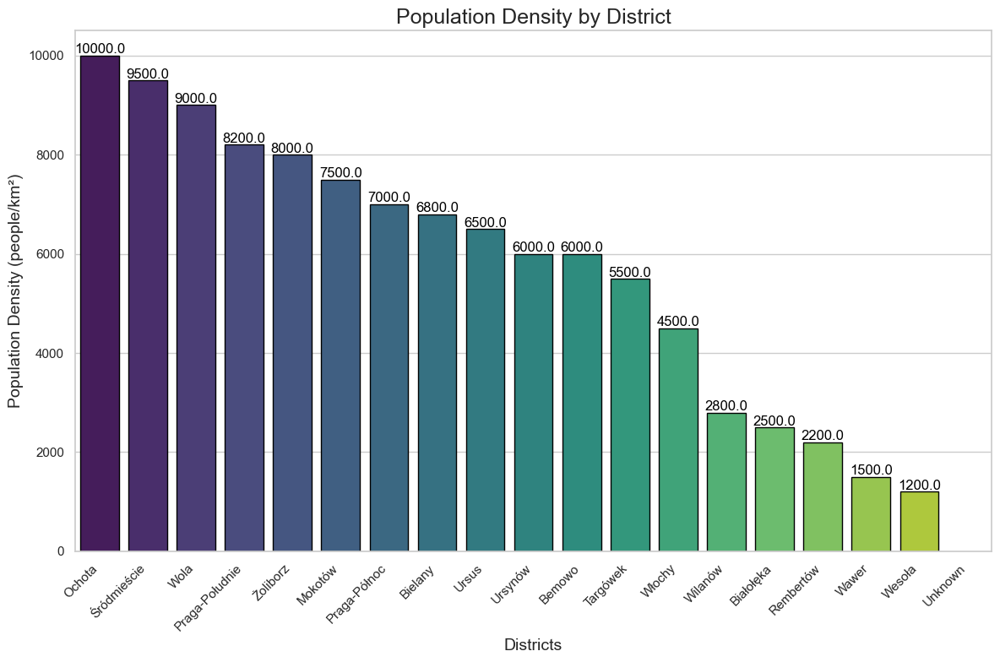

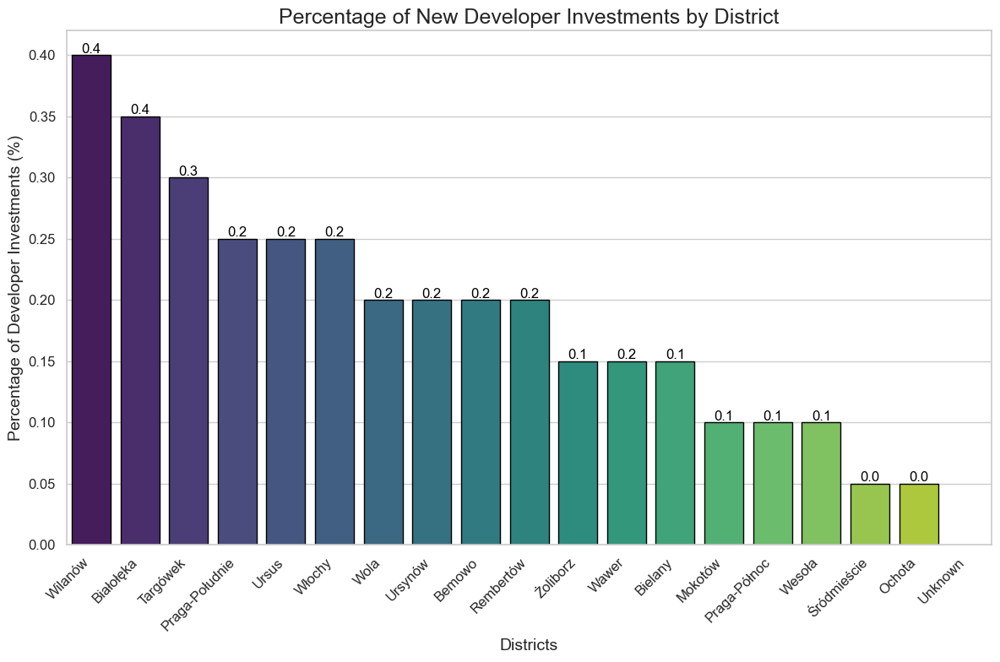

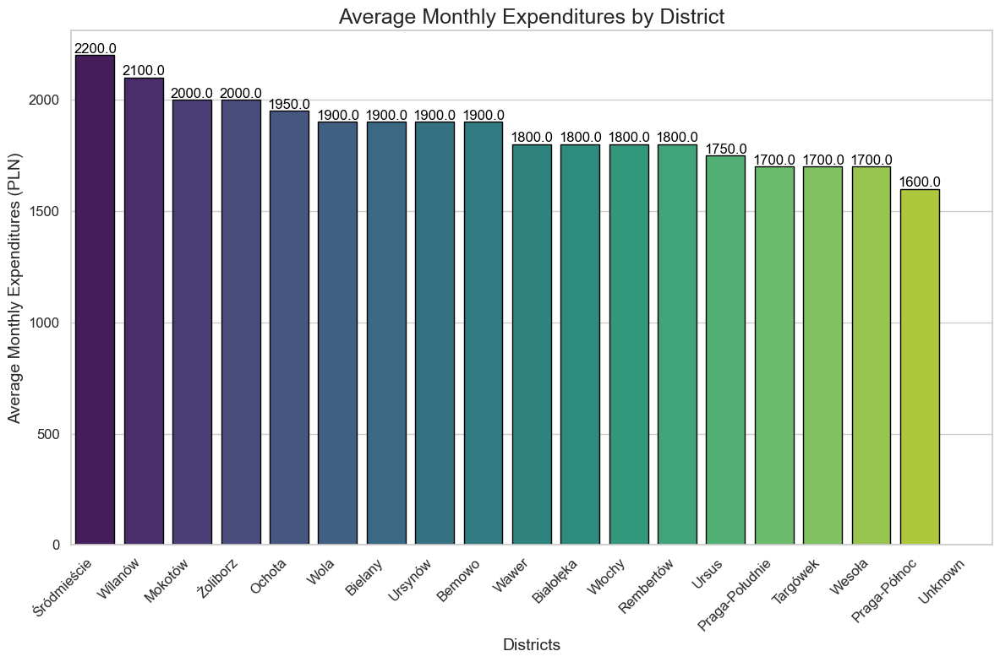

In [33]:


# Set aesthetic style
sns.set(style='whitegrid')

# 1. Bar plot: Population density by district
merged_df_sorted_population = merged_df.sort_values(by='People[km2]', ascending=False)
plt.figure(figsize=(12, 8))
bar_plot_population = sns.barplot(data=merged_df_sorted_population, x='District', y='People[km2]', 
                                   hue='District', palette='viridis', edgecolor='black', legend=False)
plt.title('Population Density by District', fontsize=18)
plt.xlabel('Districts', fontsize=14)
plt.ylabel('Population Density (people/km²)', fontsize=14)
for p in bar_plot_population.patches:
    bar_plot_population.annotate(format(p.get_height(), '.1f'), 
                                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                                 ha='center', va='center', 
                                 fontsize=12, color='black', 
                                 xytext=(0, 5), 
                                 textcoords='offset points')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 2. Bar plot: Percentage of new developer investments
merged_df_sorted_investments = merged_df.sort_values(by='Percentage of developer investments', ascending=False)
plt.figure(figsize=(12, 8))
bar_plot_investments = sns.barplot(data=merged_df_sorted_investments, x='District', y='Percentage of developer investments', 
                                    hue='District', palette='viridis', edgecolor='black', legend=False)
plt.title('Percentage of New Developer Investments by District', fontsize=18)
plt.xlabel('Districts', fontsize=14)
plt.ylabel('Percentage of Developer Investments (%)', fontsize=14)
for p in bar_plot_investments.patches:
    bar_plot_investments.annotate(format(p.get_height(), '.1f'), 
                                  (p.get_x() + p.get_width() / 2., p.get_height()), 
                                  ha='center', va='center', 
                                  fontsize=12, color='black', 
                                  xytext=(0, 5), 
                                  textcoords='offset points')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# 3. Bar plot: Average monthly expenditures
merged_df_sorted_spending = merged_df.sort_values(by='Average Monthly Expenditures', ascending=False)
plt.figure(figsize=(12, 8))
bar_plot_spending = sns.barplot(data=merged_df_sorted_spending, x='District', y='Average Monthly Expenditures', 
                                 hue='District', palette='viridis', edgecolor='black', legend=False)
plt.title('Average Monthly Expenditures by District', fontsize=18)
plt.xlabel('Districts', fontsize=14)
plt.ylabel('Average Monthly Expenditures (PLN)', fontsize=14)
for p in bar_plot_spending.patches:
    bar_plot_spending.annotate(format(p.get_height(), '.1f'), 
                               (p.get_x() + p.get_width() / 2., p.get_height()), 
                               ha='center', va='center', 
                               fontsize=12, color='black', 
                               xytext=(0, 5), 
                               textcoords='offset points')
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.2 Average distance to nearest zabka</span>
</div>





<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;"> <p><strong>Average Distance to the Nearest Żabka Store:</strong> Analyzing the proximity of Żabka stores across districts reveals varying levels of saturation. Wola and Śródmieście have the shortest distances to the nearest Żabka, with averages of 0.15 km, highlighting high store density in central areas. Mokotów (0.19 km) and Praga-Północ (0.20 km) also exhibit closely packed stores, reflecting the strong commercial presence in these regions.</p> <p><strong>Importance of Proximity:</strong> In districts like Ursynów and Ochota, distances slightly increase to 0.20 km and 0.24 km, indicating moderate concentration. Other districts, such as Ursus (0.24 km) and Bemowo (0.25 km), reflect a balanced distribution of stores, ensuring convenient access without oversaturation.</p> <p><strong>Strategic Gaps in Store Placement:</strong> On the outskirts, such as in Wesoła (0.60 km) and Wawer (0.61 km), the distances to the nearest Żabka are significantly larger. These areas present opportunities for expansion, as they are currently underserved. Similarly, districts like Rembertów (0.35 km) and Włochy (0.44 km) also reflect potential for new store development.</p> <p><strong>Conclusion:</strong> The analysis of Żabka store proximity highlights areas of high density, particularly in central Warsaw, where distances are shortest. Meanwhile, suburban districts show greater distances, providing insight into potential expansion opportunities for the brand. Balancing store placement across these areas will be crucial for maintaining efficient market coverage.</p> </div>

In [14]:
merged_df.head()

,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,"8 882,17",1800.0,0.45,0.031,1500.0,0.15
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,"8 882,17",1800.0,0.45,0.031,1500.0,0.15


C:\Users\weron\AppData\Local\Temp\ipykernel_24416\2417527864.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_distance_per_district, x='nearest_zabka_distance_km', y='District', palette='Greens', edgecolor='black')


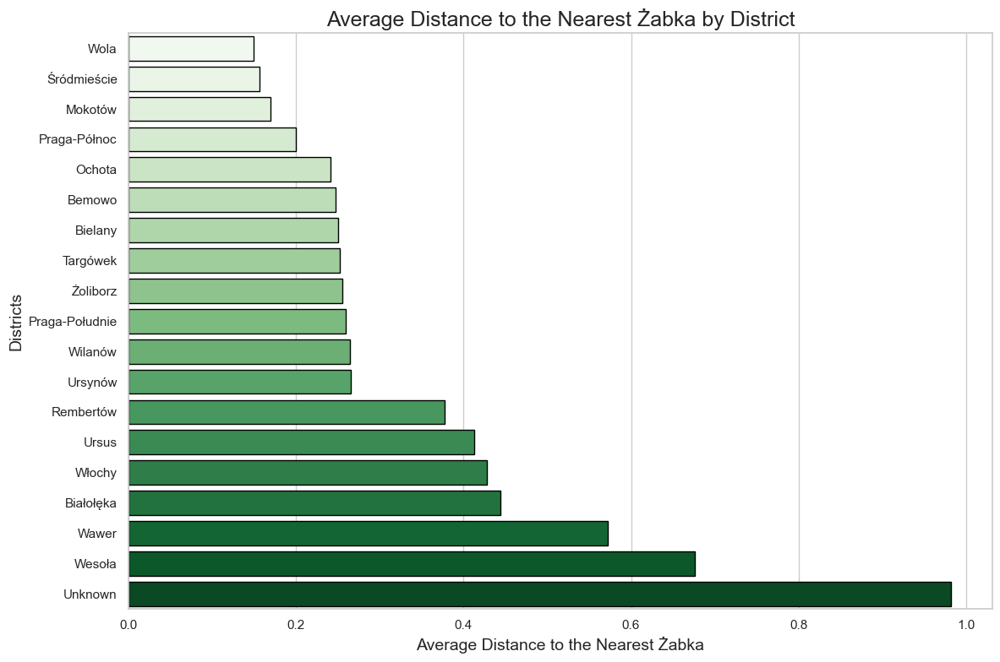

In [55]:

# Set aesthetic style
sns.set(style='whitegrid')

# 1. Calculate the average distance to the nearest Żabka for each district
avg_distance_per_district = merged_df.groupby('District')['nearest_zabka_distance_km'].mean().reset_index()

# 2. Sort by average distance (from smallest to largest)
avg_distance_per_district = avg_distance_per_district.sort_values(by='nearest_zabka_distance_km', ascending=True)

# 3. Visualization: Average distance to the nearest Żabka in each district
plt.figure(figsize=(12, 8))
sns.barplot(data=avg_distance_per_district, x='nearest_zabka_distance_km', y='District', palette='Greens', edgecolor='black')
plt.title('Average Distance to the Nearest Żabka by District', fontsize=18)
plt.xlabel('Average Distance to the Nearest Żabka', fontsize=14)  # Removed unit from x-axis label
plt.ylabel('Districts', fontsize=14)

# Removing value labels from the bars
# Commented out the label code to remove labels
# for index, row in avg_distance_per_district.iterrows():
#     plt.text(row['nearest_zabka_distance_km'] + 0.05, index, f"{row['nearest_zabka_distance_km']:.2f}", color='black', va='center')

plt.tight_layout()
plt.show()



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.3 Average distance to nearest zabka/Density and new investments</span>
</div>





<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;"> <p><strong>Correlation Between Distance to Żabka and Developer Investments:</strong> The data shows a clear trend: shorter distances to the nearest Żabka are associated with a higher percentage of developer investments. This suggests that Żabka stores are commonly located in new apartment buildings, which are driving the influx of new retail opportunities in rapidly developing areas.</p> <p><strong>Population Density and Żabka Store Proximity:</strong> Districts with the highest population density also exhibit the shortest average distance to the nearest Żabka. Areas like Śródmieście, Wola, and Mokotów, which have dense populations, feature very close store proximity. This trend highlights the relationship between densely populated areas and the demand for convenient retail options like Żabka.</p> <p><strong>Conclusion:</strong> In districts with high population density and active development, Żabka stores are well-integrated into new residential projects, reinforcing their role as essential amenities in growing urban environments. This proximity supports both the needs of the residents and the commercial success of the stores.</p> </div>

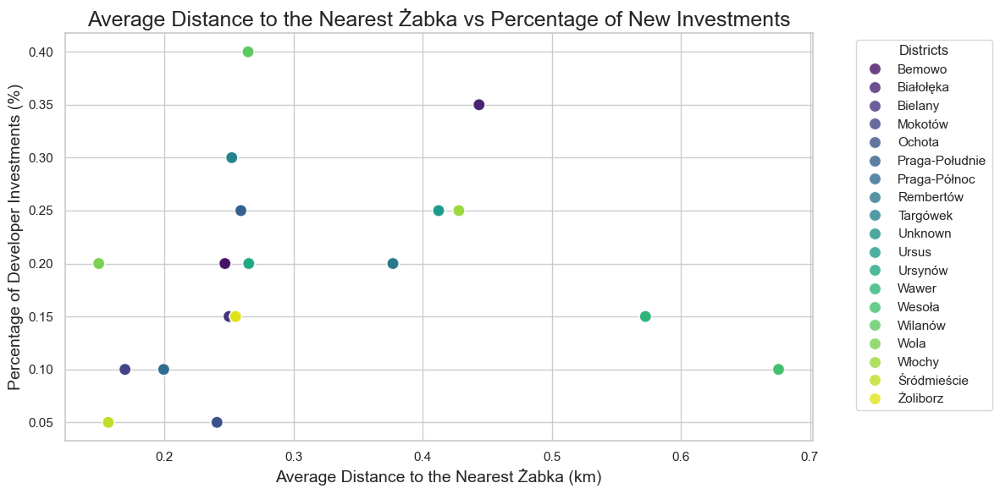

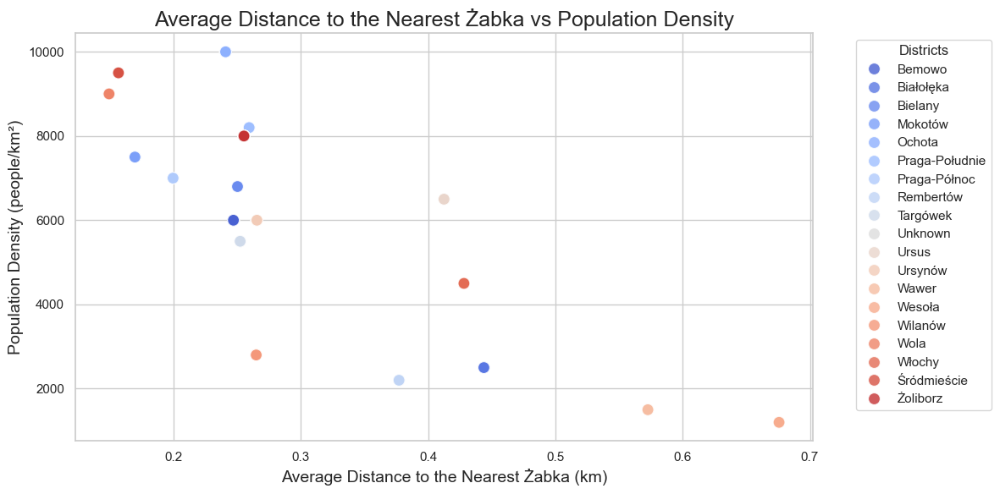

In [56]:


# Set aesthetic style
sns.set(style='whitegrid')

# 1. Calculate the average distance to the nearest Żabka for each district
avg_distance_per_district = merged_df.groupby('District')['nearest_zabka_distance_km'].mean().reset_index()

# 2. Merging the data with the original DataFrame
avg_distance_per_district = avg_distance_per_district.merge(
    merged_df[['District', 'Percentage of developer investments', 'People[km2]']],
    on='District',
    how='left'
)

# 3. Visualization: Average distance to the nearest Żabka vs Percentage of new investments
plt.figure(figsize=(12, 6))
sns.scatterplot(data=avg_distance_per_district, x='nearest_zabka_distance_km', y='Percentage of developer investments', 
                hue='District', palette='viridis', s=100, alpha=0.8)

plt.title('Average Distance to the Nearest Żabka vs Percentage of New Investments', fontsize=18)
plt.xlabel('Average Distance to the Nearest Żabka (km)', fontsize=14)
plt.ylabel('Percentage of Developer Investments (%)', fontsize=14)
plt.legend(title='Districts', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 4. Visualization: Average distance to the nearest Żabka vs Population Density
plt.figure(figsize=(12, 6))
sns.scatterplot(data=avg_distance_per_district, x='nearest_zabka_distance_km', y='People[km2]', 
                hue='District', palette='coolwarm', s=100, alpha=0.8)

plt.title('Average Distance to the Nearest Żabka vs Population Density', fontsize=18)
plt.xlabel('Average Distance to the Nearest Żabka (km)', fontsize=14)
plt.ylabel('Population Density (people/km²)', fontsize=14)
plt.legend(title='Districts', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.4 Average distance to nearest zabka/Disticts and Categories</span>
</div>





<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
<p><strong>Distribution of Żabka Stores Across Districts:</strong> The analysis reveals that the highest concentration of Żabka stores is found in the central districts of Śródmieście, Wola, Mokotów, and Ursynów. In contrast, the districts with the fewest stores are Wawer, Wesoła, and Rembertów. This trend indicates that the closer one is to the city center, the more Żabka stores are present.</p>

<p><strong>Category Insights:</strong> Among the various categories of establishments, the most prevalent are restaurants, cafes, supermarkets, and bars. This dominance highlights the vibrant commercial landscape in these districts, catering to the diverse needs of residents and visitors alike.</p>
</div>


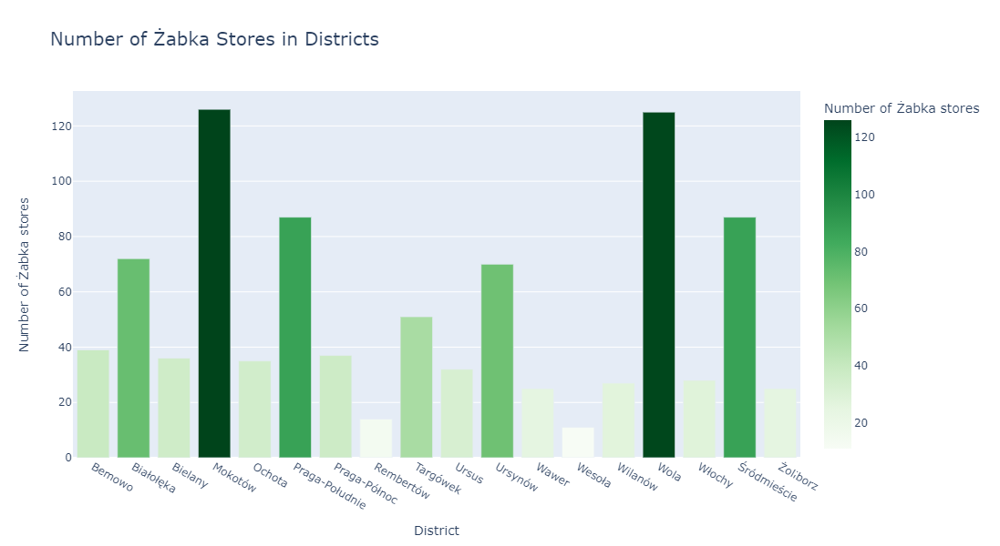

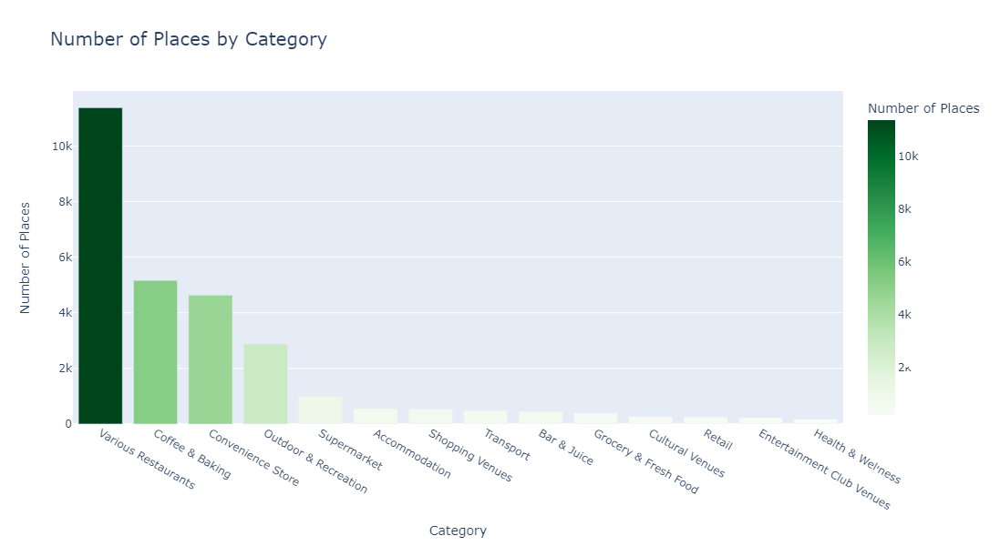

In [72]:
# Ensure that the 'store_address' column is unique within each district
zabka_counts = merged_df.groupby('District')['store_address'].nunique().reset_index()

# Rename columns
zabka_counts.columns = ['District', 'Number of Żabka stores']

# 2. Number of places by category (loc_category)
loc_category_counts = merged_df['loc_category'].value_counts().reset_index()
loc_category_counts.columns = ['loc_category', 'Number of places']

# 3. Top 10 most common nearest_venue_name
nearest_venue_counts = merged_df['nearest_venue_name'].value_counts().head(10).reset_index()
nearest_venue_counts.columns = ['nearest_venue_name', 'Number']

# 4. Average distance to the nearest venue for each district
avg_distance_per_district = merged_df.groupby('District')['nearest_venue_distance_km'].mean().reset_index()

# Interactive plot settings

# Plot of the number of Żabka stores in districts
fig1 = px.bar(zabka_counts, x='District', y='Number of Żabka stores', 
               title='Number of Żabka Stores in Districts', 
               labels={'District': 'District', 'Number of Żabka stores': 'Number of Żabka stores'},
               color='Number of Żabka stores', 
               color_continuous_scale=px.colors.sequential.Greens)  # Shades of green scale

fig1.update_layout(bargap=0.2,  # Space between bars
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20))

# Plot of the number of places by loc_category
fig2 = px.bar(loc_category_counts, x='loc_category', y='Number of places', 
               title='Number of Places by Category',
               labels={'loc_category': 'Category', 'Number of places': 'Number of Places'},
               color='Number of places', 
               color_continuous_scale=px.colors.sequential.Greens)  # Shades of green scale

fig2.update_layout(bargap=0.2, 
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20))

# Plot of the top 10 most common nearest venues
fig3 = px.bar(nearest_venue_counts, x='nearest_venue_name', y='Number', 
               title='Top 10 Most Common Nearest Venues',
               labels={'nearest_venue_name': 'Nearest Venue Name', 'Number': 'Number'},
               color='Number', 
               color_continuous_scale=px.colors.sequential.Greens)  # Shades of green scale

fig3.update_layout(bargap=0.2, 
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20))

# Plot of average distance to the nearest venue for each district
fig4 = px.bar(avg_distance_per_district, x='District', y='nearest_venue_distance_km', 
               title='Average Distance to the Nearest Venue by District',
               labels={'District': 'District', 'nearest_venue_distance_km': 'Average Distance (km)'},
               color='nearest_venue_distance_km', 
               color_continuous_scale=px.colors.sequential.Greens)  # Shades of green scale

fig4.update_layout(bargap=0.2, 
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20))

# Display plots
fig1.show()
fig2.show()
fig3.show()
fig4.show()


In [74]:
# Łączenie z merged_df na podstawie kolumny 'District'
merged_df = merged_df.merge(zabka_counts, on='District', how='left')
merged_df.head()

,store_address,store_lat,store_lng,venue_name,venue_category,venue_lat,venue_lng,loc_category,cluster,nearest_venue_name,nearest_venue_distance_km,District,nearest_zabka_distance_km,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,Number of Żabka stores
0,ul. Żegańska 18,52.20562,21.172909,Peron Cafe,Café,52.203553,21.168409,Coffee & Baking,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,25
1,ul. Żegańska 18,52.20562,21.172909,Stacja Wawer,Restaurant,52.206043,21.169056,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,25
2,ul. Żegańska 18,52.20562,21.172909,Burger Point,Burger Joint,52.203547,21.168299,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,25
3,ul. Żegańska 18,52.20562,21.172909,Warszawa Międzylesie,Rail Station,52.204487,21.168195,Transport,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,25
4,ul. Żegańska 18,52.20562,21.172909,Kawa i chili,Mexican Restaurant,52.206675,21.178419,Various Restaurants,1,Lidl,0.116597,Wawer,0.795036,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,25




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.5 Top 10 most common nearest venues/Average distance to the nearest venue by district </span>
</div>





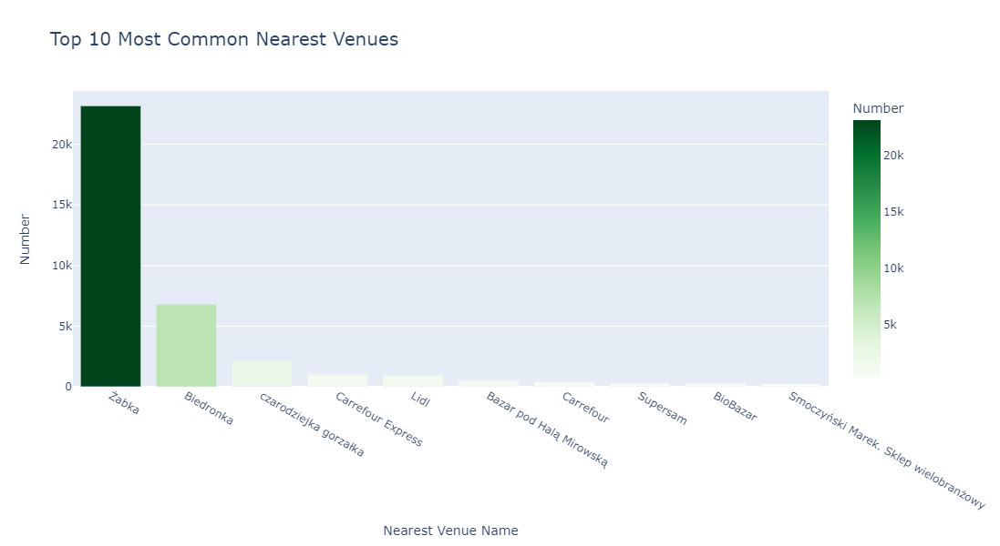

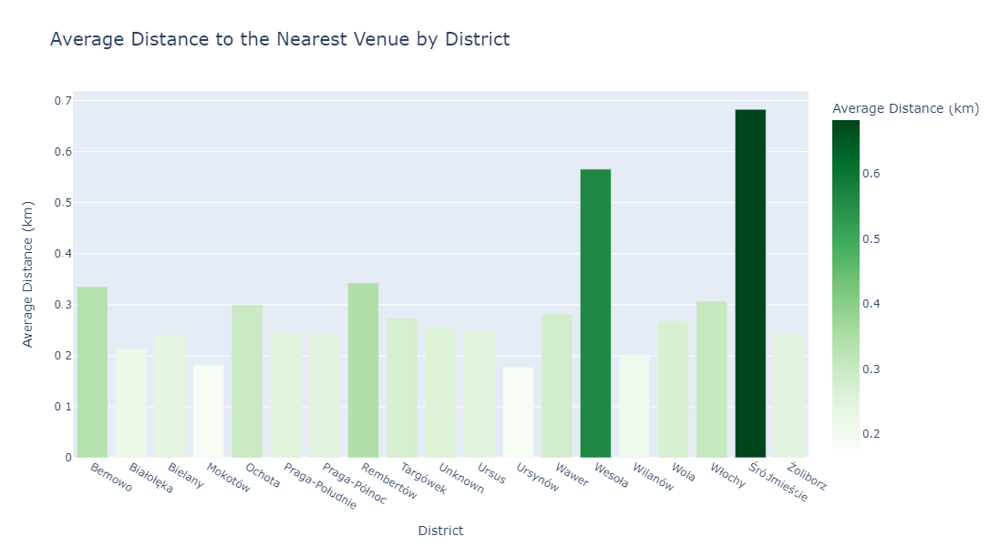

In [58]:
fig3.show()
fig4.show()



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.6 Families with children/unemployment rate</span>
</div>





<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
<p><strong>Distribution of Families with Children:</strong> The analysis shows that the highest percentage of families with children can be found in the districts of Praga, Ursynów, and Białołęka. These areas provide a supportive environment for families, with amenities and services tailored to their needs.</p>

<p><strong>Unemployment Rate Insights:</strong> Conversely, the districts with the highest unemployment rates are Praga and Wawer. This suggests that these areas may face economic challenges, impacting the livelihoods and well-being of their residents.</p>
</div>


Dataframe dla rodzin z dziećmi (unikalne wartości per district):
   District  Percentage of Families with Children
0     Wawer                                  0.45
13     Wola                                  0.30
43  Ursynów                                  0.40
62  Mokotów                                  0.30
88  Bielany                                  0.42
Dataframe dla stopy bezrobocia (unikalne wartości per district):
   District  Unemployment Rate
0     Wawer              0.031
13     Wola              0.030
43  Ursynów              0.032
62  Mokotów              0.028
88  Bielany              0.031


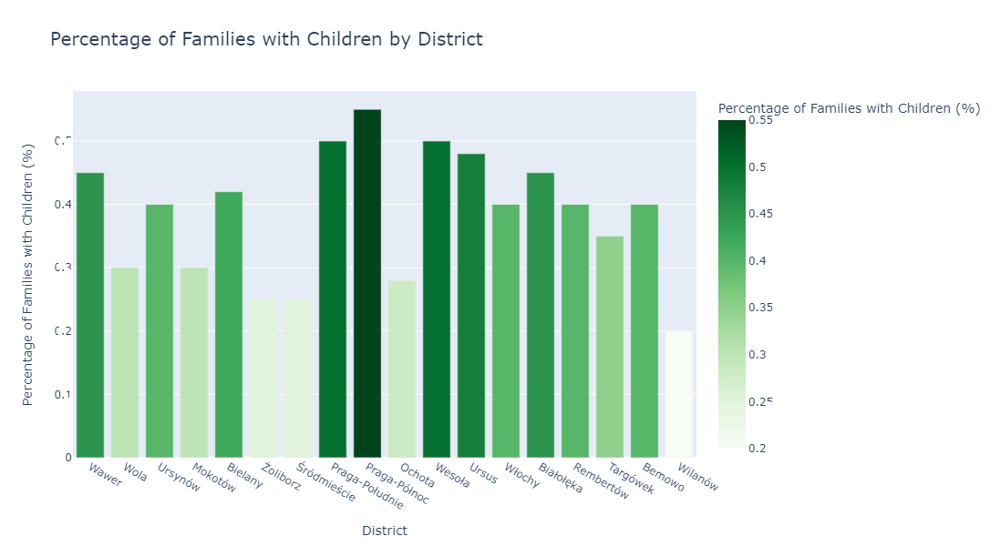

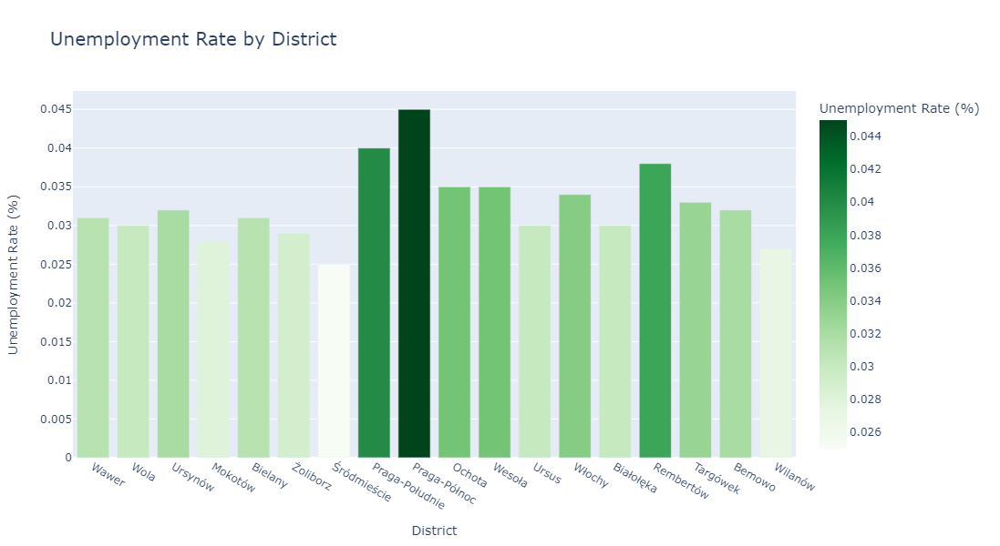

In [69]:
import pandas as pd

# Załaduj dane (upewnij się, że ścieżka do pliku jest poprawna)
# merged_df = pd.read_csv('your_file.csv')  # Zakładając, że masz odpowiedni plik CSV

# Konwersja kolumn na liczby
merged_df['Percentage of Families with Children'] = pd.to_numeric(merged_df['Percentage of Families with Children'], errors='coerce')
merged_df['Unemployment Rate'] = pd.to_numeric(merged_df['Unemployment Rate'], errors='coerce')

# Filtrowanie unikalnych wartości dla każdego districtu
df_families = merged_df[['District', 'Percentage of Families with Children']].drop_duplicates(subset='District')
df_unemployment = merged_df[['District', 'Unemployment Rate']].drop_duplicates(subset='District')

# Sprawdzenie wyników
print("Dataframe dla rodzin z dziećmi (unikalne wartości per district):")
print(df_families.head())

print("Dataframe dla stopy bezrobocia (unikalne wartości per district):")
print(df_unemployment.head())

# Teraz wykresy, korzystając z odpowiednich danych
import plotly.express as px

# Plotting the percentage of families with children
fig8 = px.bar(df_families, x='District', y='Percentage of Families with Children', 
               title='Percentage of Families with Children by District',
               labels={'District': 'District', 'Percentage of Families with Children': 'Percentage of Families with Children (%)'},
               color='Percentage of Families with Children', 
               color_continuous_scale=px.colors.sequential.Greens)  # Green color scale

fig8.update_layout(bargap=0.2, 
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20),
                    yaxis=dict(showticklabels=True))  # Show Y-axis tick labels

# Plotting the unemployment rate
fig9 = px.bar(df_unemployment, x='District', y='Unemployment Rate', 
               title='Unemployment Rate by District',
               labels={'District': 'District', 'Unemployment Rate': 'Unemployment Rate (%)'},
               color='Unemployment Rate', 
               color_continuous_scale=px.colors.sequential.Greens)  # Green color scale

fig9.update_layout(bargap=0.2, 
                    height=600, 
                    xaxis_title_font=dict(size=14),
                    yaxis_title_font=dict(size=14),
                    title_font=dict(size=20),
                    yaxis=dict(showticklabels=True))  # Show Y-axis tick labels

# Display the plots
fig8.show()
fig9.show()




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">10.7 Number of zabkas in districts</span>
</div>






<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
Żabka stores are generally more concentrated in areas with higher population density. This makes sense as these densely populated regions offer a larger customer base.

**In terms of developer investments**, while areas with significant new developments might not yet have a large number of Żabka stores, there is a clear plan to expand into these regions. These locations represent a low-risk opportunity for growth, as Żabka stores are often pre-planned, making them a strategic focus for future expansion.

**We see more Żabka stores in wealthier districts**, where unemployment rates are lower and average incomes are higher. These areas present a lucrative market with stable economic conditions.

On the other hand, there tend to be fewer Żabka stores in **family-oriented** districts with a high proportion of households with children, such as suburban areas like Wawer. In contrast, Żabka stores are more likely to be concentrated in urban centers, where there are fewer families with children and more single or smaller households.

</div>

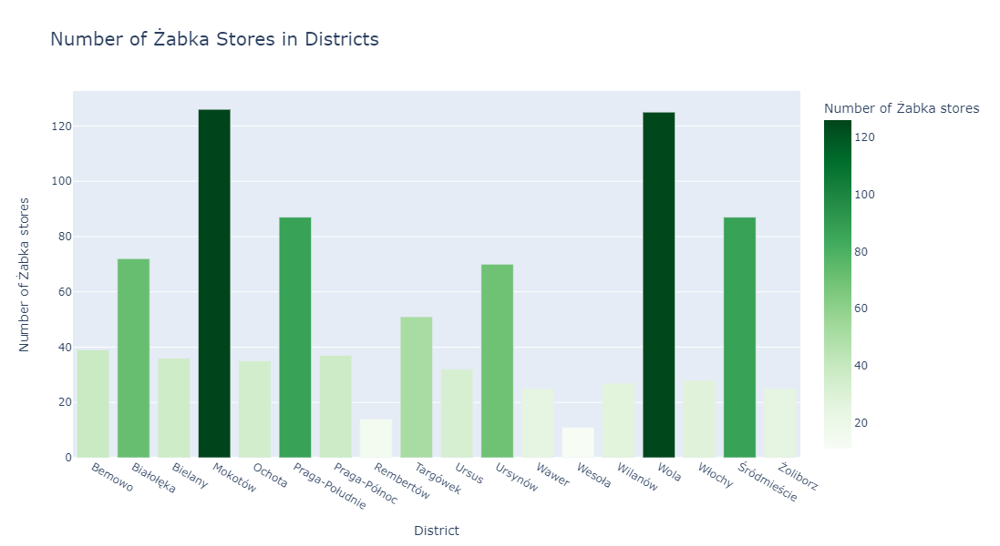

In [78]:
fig1.show()



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">11 Labels?</span>
</div>





<div style="background-color: #f9f9f9; padding: 20px; border-radius: 5px; font-family: Arial, sans-serif; line-height: 1.6; color: #333;">
    
 **Goal: Clustering Locations**
    Since we do not have a predefined label indicating whether a location is good (0 = bad, 1 = good), we first need to create such a label based on the available data. This type of task can be approached using unsupervised machine learning, which helps in data analysis without the need for labels. This means we will utilize algorithms that group data based on similarity rather than predefined labels.</p>
    
   **Steps to Approach the Problem:**
    
  **Clustering Locations:** Instead of classifying locations as "good" or "bad," we can group them into clusters based on their features. We will use a clustering algorithm, such as K-means or DBSCAN, to cluster locations based on similarities in their characteristics. This approach allows us to detect patterns and discover what features characterize potentially good locations.</li>
 

</div>




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">11.1 Dummy variablea and grouping by eacvh shop(after analysis of each shop neighbourhood and having bigger dataframe)</span>
</div>





In [80]:
# 1. One-Hot Encoding for the 'new_category' column
loc_category_dummies = pd.get_dummies(merged_df['loc_category'], prefix='category')

# 2. Merging the dummy columns with the original DataFrame
merged_df_with_dummies = pd.concat([merged_df, loc_category_dummies], axis=1)

# Selecting features for clustering, including dummy columns
features = [
    'store_lat',  # Latitude
    'store_lng',  # Longitude
    'Average salary',
    'Average Monthly Expenditures',
    'Percentage of Families with Children',
    'Unemployment Rate',
    'People[km2]',
    'Percentage of developer investments',
    'nearest_venue_distance_km',
    'nearest_zabka_distance_km',
    'District'
]

# Adding dummy columns from categories
features += list(loc_category_dummies.columns)

# Removing missing values (optional - you can replace with means/medians)
merged_df_clean = merged_df_with_dummies[features].dropna()
merged_df_clean.head(17)


,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,District,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants
0,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,1
5,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,52.205620,21.172909,"8 882,17",1800.0,0.45,0.031,1500.0,0.15,0.116597,0.795036,Wawer,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [81]:
filtered_row = merged_df_clean[(merged_df_clean['store_lat'] == 52.128170) & (merged_df_clean['store_lng'] == 21.069390)]

# Wyświetlenie wyników
filtered_row.head()

,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,District,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants
28344,52.12817,21.06939,"9 899,71",1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,Ursynów,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28345,52.12817,21.06939,"9 899,71",1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,Ursynów,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28346,52.12817,21.06939,"9 899,71",1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,Ursynów,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28347,52.12817,21.06939,"9 899,71",1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,Ursynów,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28348,52.12817,21.06939,"9 899,71",1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,Ursynów,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [82]:


# Converting numeric columns to the appropriate format
num_cols = ['Average salary', 'Average Monthly Expenditures', 'Percentage of Families with Children',
            'Unemployment Rate', 'People[km2]', 'Percentage of developer investments',
            'nearest_venue_distance_km', 'nearest_zabka_distance_km']

# Removing spaces and replacing commas with dots, then converting to floating-point numbers
for col in num_cols:
    merged_df_clean[col] = merged_df_clean[col].astype(str).str.replace(' ', '').str.replace(',', '.')
    merged_df_clean[col] = pd.to_numeric(merged_df_clean[col], errors='coerce')

# Checking the results of the transformation
print(merged_df_clean[num_cols].head())

# Grouping by unique coordinates (store_lat and store_lng)
grouped_data = merged_df_clean.groupby(['store_lat', 'store_lng']).agg({
    'Average salary': 'first',
    'Average Monthly Expenditures': 'first',
    'Percentage of Families with Children': 'first',
    'Unemployment Rate': 'first',
    'People[km2]': 'first',
    'Percentage of developer investments': 'first',
    'nearest_venue_distance_km': 'first',
    'nearest_zabka_distance_km': 'first',
   
    # Categorical - aggregating by maximum value (i.e., if there's a 1, it remains 1)
    'category_Accommodation': 'max',
    'category_Bar & Juice': 'max',
    'category_Coffee & Baking': 'max',
    'category_Convenience Store': 'max',
    'category_Cultural Venues': 'max',
    'category_Entertainment Club Venues': 'max',
    'category_Grocery & Fresh Food': 'max',
    'category_Health & Wellness': 'max',
    'category_Outdoor & Recreation': 'max',
    'category_Retail': 'max',
    'category_Shopping Venues': 'max',
    'category_Supermarket': 'max',
    'category_Transport': 'max',
    'category_Various Restaurants': 'max'
}).reset_index()

# Saving the processed data to a new file (if desired)
grouped_data.to_csv('processed_data.csv', index=False)


   Average salary  Average Monthly Expenditures  \
0         8882.17                        1800.0   
1         8882.17                        1800.0   
2         8882.17                        1800.0   
3         8882.17                        1800.0   
4         8882.17                        1800.0   

   Percentage of Families with Children  Unemployment Rate  People[km2]  \
0                                  0.45              0.031       1500.0   
1                                  0.45              0.031       1500.0   
2                                  0.45              0.031       1500.0   
3                                  0.45              0.031       1500.0   
4                                  0.45              0.031       1500.0   

   Percentage of developer investments  nearest_venue_distance_km  \
0                                 0.15                   0.116597   
1                                 0.15                   0.116597   
2                                 0

In [83]:
grouped_data.head()

,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants
0,52.128170,21.069390,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,0,0,1,0,0,0,0,0,1,1,0,0,0,1
1,52.129650,21.058392,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.626657,0.168040,0,1,1,0,0,0,0,0,1,0,0,0,0,1
2,52.129710,21.065800,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.186184,0.215240,0,0,1,0,0,0,0,0,1,1,0,0,0,1
3,52.130943,21.062122,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468886,0.264487,0,1,1,0,0,0,0,0,1,1,1,0,0,1
4,52.130968,21.057194,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468547,0.164891,0,1,0,0,0,0,0,0,0,0,0,1,0,1




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">12. One more clustering after adding info about places categories</span>
</div>


In [84]:
# Data normalization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(grouped_data)

# Step 2: K-means Clustering

# Setting the number of clusters
kclusters = 4  # You can change this value to adjust the number of clusters

# Running K-means
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X_scaled)

# Checking the cluster labels
grouped_data['Cluster Labels'] = kmeans.labels_

# Creating the map
map_clusters = folium.Map(location=[52.2297, 21.0122], zoom_start=11)  # Warsaw

# Setting colors for the clusters
x = np.arange(kclusters)
ys = [i + x + (i * x) ** 2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# Adding markers to the map
for lat, lon, cluster in zip(grouped_data['store_lat'], grouped_data['store_lng'], grouped_data['Cluster Labels']):
    label = folium.Popup('Cluster ' + str(cluster), parse_html=True)
    
    if pd.notna(cluster):  # Checking if cluster is not NaN
        cluster_index = int(cluster)  # Casting to int
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster_index],  # Using the cast value
            fill=True,
            fill_color=rainbow[cluster_index],  # Using the cast value
            fill_opacity=0.7).add_to(map_clusters)

# Displaying the map
map_clusters


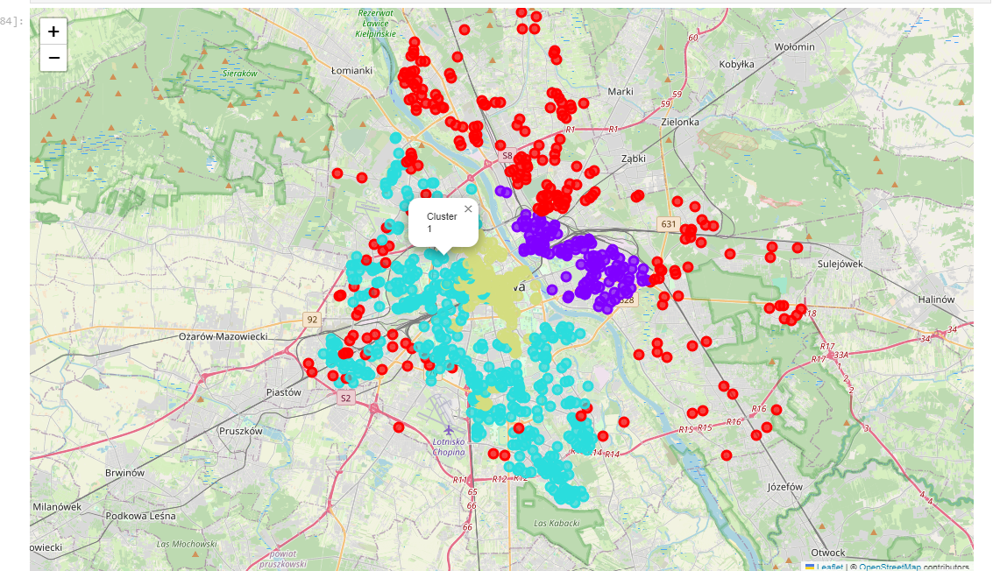

In [85]:
# Checking the cluster labels
grouped_data['Cluster Labels'] = kmeans.labels_

# Calculating statistics for each cluster
cluster_stats = grouped_data.groupby('Cluster Labels').agg({
    'Average salary': ['mean', 'std'],
    'Average Monthly Expenditures': ['mean', 'std'],
    'Percentage of Families with Children': ['mean', 'std'],
    'Unemployment Rate': ['mean', 'std'],
    'People[km2]': ['mean', 'std'],
    'Percentage of developer investments': ['mean', 'std'],
    'nearest_venue_distance_km': ['mean', 'std'],
    'nearest_zabka_distance_km': ['mean', 'std'],
}).reset_index()

# Renaming columns for better readability
cluster_stats.columns = ['Cluster Labels'] + [f'{col[0]}_{col[1]}' for col in cluster_stats.columns[1:]]

# Calculating the proportion of categories for each cluster
category_columns = [
    'category_Accommodation', 'category_Bar & Juice', 'category_Coffee & Baking',
    'category_Convenience Store', 'category_Cultural Venues', 'category_Entertainment Club Venues',
    'category_Grocery & Fresh Food', 'category_Health & Wellness', 'category_Outdoor & Recreation',
    'category_Retail', 'category_Shopping Venues', 'category_Supermarket', 'category_Transport',
    'category_Various Restaurants'
]

# Adding category percentage to the cluster statistics
for category in category_columns:
    # Calculating the percentage of cases in each cluster that belong to the given category
    category_count = grouped_data.groupby('Cluster Labels')[category].value_counts(normalize=True).unstack().fillna(0) * 100
    category_count = category_count.reset_index()
    
    # Renaming columns for better readability
    category_count.columns = ['Cluster Labels'] + [f'{category}_{int(col)}%' for col in category_count.columns[1:]]

    # Merging cluster statistics with category percentages
    cluster_stats = pd.merge(cluster_stats, category_count, on='Cluster Labels', how='left')

# Displaying statistics for each cluster
cluster_stats


,Cluster Labels,Average salary_mean,Average salary_std,Average Monthly Expenditures_mean,Average Monthly Expenditures_std,Percentage of Families with Children_mean,Percentage of Families with Children_std,Unemployment Rate_mean,Unemployment Rate_std,People[km2]_mean,People[km2]_std,Percentage of developer investments_mean,Percentage of developer investments_std,nearest_venue_distance_km_mean,nearest_venue_distance_km_std,nearest_zabka_distance_km_mean,nearest_zabka_distance_km_std,category_Accommodation_0%,category_Accommodation_1%,category_Bar & Juice_0%,category_Bar & Juice_1%,category_Coffee & Baking_0%,category_Coffee & Baking_1%,category_Convenience Store_0%,category_Convenience Store_1%,category_Cultural Venues_0%,category_Cultural Venues_1%,category_Entertainment Club Venues_0%,category_Entertainment Club Venues_1%,category_Grocery & Fresh Food_0%,category_Grocery & Fresh Food_1%,category_Health & Wellness_0%,category_Health & Wellness_1%,category_Outdoor & Recreation_0%,category_Outdoor & Recreation_1%,category_Retail_0%,category_Retail_1%,category_Shopping Venues_0%,category_Shopping Venues_1%,category_Supermarket_0%,category_Supermarket_1%,category_Transport_0%,category_Transport_1%,category_Various Restaurants_0%,category_Various Restaurants_1%
0,0,9845.872984,335.527502,1670.161290,45.940645,0.514919,0.022970,0.041492,0.002297,7841.935484,551.287742,0.205242,0.068911,0.244223,0.125027,0.228460,0.126893,56.451613,43.548387,67.741935,32.258065,37.096774,62.903226,87.903226,12.096774,74.193548,25.806452,66.129032,33.870968,73.387097,26.612903,83.064516,16.935484,66.935484,33.064516,76.612903,23.387097,70.161290,29.838710,29.838710,70.161290,58.064516,41.935484,15.322581,84.677419
1,1,9994.239212,697.065373,1933.174224,78.546580,0.332411,0.069998,0.030222,0.002146,7228.400955,1706.974175,0.175656,0.077825,0.286104,0.188148,0.225096,0.130311,81.622912,18.377088,85.918854,14.081146,24.821002,75.178998,81.384248,18.615752,88.782816,11.217184,79.474940,20.525060,73.747017,26.252983,76.372315,23.627685,55.847255,44.152745,93.317422,6.682578,73.031026,26.968974,43.198091,56.801909,54.415274,45.584726,6.921241,93.078759
2,2,12060.006258,1409.042101,2084.516129,132.969060,0.271226,0.024157,0.027174,0.002801,9096.774194,729.918992,0.093548,0.062343,0.531293,0.351582,0.148572,0.076076,20.645161,79.354839,9.677419,90.322581,1.290323,98.709677,91.612903,8.387097,30.967742,69.032258,65.806452,34.193548,76.129032,23.870968,92.258065,7.741935,43.870968,56.129032,100.000000,0.000000,41.935484,58.064516,81.935484,18.064516,93.548387,6.451613,0.000000,100.000000
3,3,9091.389782,361.199330,1789.737991,74.732983,0.415109,0.052920,0.031913,0.002264,3747.598253,1850.641400,0.264192,0.084068,0.384643,0.373607,0.378319,0.337205,93.013100,6.986900,98.253275,1.746725,79.912664,20.087336,91.703057,8.296943,95.633188,4.366812,95.196507,4.803493,83.406114,16.593886,90.829694,9.170306,70.305677,29.694323,74.235808,25.764192,70.305677,29.694323,59.388646,40.611354,57.641921,42.358079,58.515284,41.484716


- **Cluster 2 (City Center of Warsaw)**: High average salary (12060 PLN) and high population density (9096 people/km²). Low unemployment rate (2.71%) and very close proximity to services, including Żabka stores (0.15 km). There are fewer families with children (27.12%), suggesting a younger population. The area features vibrant cultural venues, restaurants, shopping centers, and efficient public transport.

- **Cluster 0 (Outer City Center)**: Moderate salary (9845 PLN) and population density (7841 people/km²). A higher percentage of families with children (51.49%), with low unemployment (4.15%). Services are easily accessible, though not as concentrated as in the city center. This cluster is home to numerous parks, local shops, cafes, and schools, offering a family-friendly atmosphere.

- **Cluster 3 (Peripheral Areas)**: Lower salaries (9091 PLN) and lower population density (3747 people/km²). Higher unemployment rate (5.72%) and less access to Żabka stores (0.38 km). A larger proportion of families with children (41.51%) and fewer services. These areas are more residential, with open spaces, sports facilities, and schools, offering a quieter lifestyle away from the hustle of the city.

- **Cluster 1 (Between City Center and the Outskirts)**: Moderate average salary (9994 PLN) and average population density (7228 people/km²). Low unemployment (3.02%) and varied service availability. A moderate percentage of families with children (33.24%). This cluster is located near suburban shopping malls, cafes, and transport hubs, making it a balanced option for both work and leisure.




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">13. Labeling decision</span>
</div>


<div style="background-color: #f9f9f9; padding: 15px; border-radius: 5px; font-family: Arial, sans-serif; color: #333;">

### Labeling Strategy Evaluation

Your approach to assigning labels based on clusters and proximity is a good starting point. Since the model already segmented locations into clusters, using these as a foundation for label assignment makes sense. Here are a few suggestions to further refine your approach:

1. **Using Clusters as the Main Criterion**:
   Since the model has already grouped similar locations, using clusters to determine profitability is logical. It should reflect key characteristics that indicate location viability for the store.I assigned profitable locations mainly to city center areas here.

2. **Refining the Distance Condition**:
   Setting profitability to `0` when another Żabka is within 0.5 km is practical. However, consider an adaptive threshold based on area density. For instance, Cluster 1 might support a higher store density compared to peripheral clusters.

3. **Adding More Conditions**:
   Additional factors could further refine profitability labels, such as:
   - **Customer Spending Potential**: Average monthly expenditures can indicate customer spending behavior.
   - **Competition Density**: High availability of supermarkets or convenience stores in a cluster may lower the potential for new Żabka stores.

Overall, using clusters as the main profitability indicator is a strong approach, and additional conditions could enhance the analysis.

</div>


In [86]:
grouped_data.head()

,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants,Cluster Labels
0,52.128170,21.069390,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1
1,52.129650,21.058392,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.626657,0.168040,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1
2,52.129710,21.065800,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.186184,0.215240,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1
3,52.130943,21.062122,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468886,0.264487,0,1,1,0,0,0,0,0,1,1,1,0,0,1,1
4,52.130968,21.057194,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468547,0.164891,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1


In [87]:
# Step 1: Create district_df with unique store_lat and store_lng from merged_df
district_df = merged_df[['store_lat', 'store_lng', 'District']].drop_duplicates()
district_df.head(10)

,store_lat,store_lng,District
0,52.205620,21.172909,Wawer
13,52.235723,20.989872,Wola
43,52.155407,21.029269,Ursynów
62,52.208317,21.012640,Mokotów
88,52.285133,20.927041,Bielany
92,52.143715,21.044521,Ursynów
110,52.270840,20.981248,Żoliborz
139,52.235637,20.938834,Wola
143,52.238903,21.024944,Śródmieście
173,52.253869,21.081144,Praga-Południe


In [88]:


# Step 1: Create district_df with unique store_lat and store_lng from merged_df
district_df = merged_df[['store_lat', 'store_lng', 'District']].drop_duplicates()

# Step 2: Merge district_df with grouped_data
grouped_data1 = grouped_data.merge(
    district_df,                # Use district_df created in Step 1
    on=['store_lat', 'store_lng'],  # Merge on store_lat and store_lng
    how='left'                  # Use left join to keep all rows in grouped_data
)

# Display the updated DataFrame
grouped_data1.head(10)


,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants,Cluster Labels,District
0,52.128170,21.069390,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,Ursynów
1,52.129650,21.058392,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.626657,0.168040,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,Ursynów
2,52.129710,21.065800,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.186184,0.215240,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,Ursynów
3,52.130943,21.062122,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468886,0.264487,0,1,1,0,0,0,0,0,1,1,1,0,0,1,1,Ursynów
4,52.130968,21.057194,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468547,0.164891,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,Ursynów
5,52.131113,21.076487,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.401556,0.291172,0,0,1,0,0,1,0,0,0,0,0,1,0,1,1,Ursynów
6,52.131511,21.066947,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.334436,0.104706,0,0,1,0,0,0,1,0,1,1,1,0,0,1,1,Ursynów
7,52.131881,21.070219,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.353482,0.168771,0,0,1,0,0,0,1,0,1,1,0,1,0,1,1,Ursynów
8,52.132100,21.058748,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.503288,0.164891,0,1,1,0,0,0,0,1,0,0,1,0,0,1,1,Ursynów
9,52.132437,21.067219,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.394561,0.104706,0,0,1,0,0,0,1,0,1,1,1,0,0,1,1,Ursynów


In [91]:

# Function to assign profitability label with adaptive conditions
def assign_profitability_label(row):
    # Base profitability label based on clusters
    if row['Cluster Labels'] in [2, 0]:
        label = 1  # Profitable
    elif row['Cluster Labels'] in [3, 1]:
        label = 0  # Not Profitable
    else:
        label = None  # Default if unknown cluster

    # Apply adaptive conditions based on distance thresholds for each cluster
    if row['Cluster Labels'] == 2 and row['nearest_zabka_distance_km'] < 0.2:
        label = 0  # Not profitable if another Żabka is within 0.1 km in Cluster 1
    elif row['Cluster Labels'] == 0 and row['nearest_zabka_distance_km'] < 0.3:
        label = 0  # Not profitable if another Żabka is within 0.2 km in Cluster 2
   
    # Mark all Żabka locations in Cluster 3 on Ochota and Wola as profitable
    if row['Cluster Labels'] == 1 and row['District'] in ['Ochota', 'Wola']:
        label = 1

    # Mark locations with high average expenditures as profitable
    if row['Average Monthly Expenditures'] >= 2000:
        label = 1

    return label

# Apply the function to assign profitability labels to the DataFrame
grouped_data1['Profitability Label'] = grouped_data1.apply(assign_profitability_label, axis=1)

# Display the updated DataFrame
grouped_data1.head()


,store_lat,store_lng,Average salary,Average Monthly Expenditures,Percentage of Families with Children,Unemployment Rate,People[km2],Percentage of developer investments,nearest_venue_distance_km,nearest_zabka_distance_km,category_Accommodation,category_Bar & Juice,category_Coffee & Baking,category_Convenience Store,category_Cultural Venues,category_Entertainment Club Venues,category_Grocery & Fresh Food,category_Health & Wellness,category_Outdoor & Recreation,category_Retail,category_Shopping Venues,category_Supermarket,category_Transport,category_Various Restaurants,Cluster Labels,District,Profitability Label
0,52.128170,21.069390,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.119603,0.299671,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,Ursynów,0
1,52.129650,21.058392,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.626657,0.168040,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,Ursynów,0
2,52.129710,21.065800,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.186184,0.215240,0,0,1,0,0,0,0,0,1,1,0,0,0,1,1,Ursynów,0
3,52.130943,21.062122,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468886,0.264487,0,1,1,0,0,0,0,0,1,1,1,0,0,1,1,Ursynów,0
4,52.130968,21.057194,9899.71,1900.0,0.4,0.032,6000.0,0.2,0.468547,0.164891,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,Ursynów,0


In [92]:
grouped_data1.shape

(927, 27)

In [93]:
# Counting the number of occurrences for each class in the 'Profitability Label' column
label_counts = grouped_data1['Profitability Label'].value_counts()

# Displaying the number of occurrences for each class
print(label_counts)


0    513
1    414
Name: Profitability Label, dtype: int64


In [94]:
final_df=grouped_data1

<div style="background-color: #f9f9f9; padding: 10px;">

The label distribution is relatively balanced, with about slightlky more Not Profitable-0 than `1` (Profitable). This moderate balance should work well for most models.  

In case of other distribuction, more imbalanced,using sampling techniques (Oversampling/Undersampling) would be necessary to consider.
</div>




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">14. Modelling</span>
</div>


In [95]:


# Assuming merged_df_clean is already created and contains the 'Profitability Label' column

# Step 1: Selecting variables for the model
# Selecting independent variables (X) and the dependent variable (y)
X = final_df[['store_lat', 'store_lng', 'Average salary', 'Average Monthly Expenditures', 
               'Percentage of Families with Children', 'Unemployment Rate', 'People[km2]', 
               'Percentage of developer investments', 'nearest_venue_distance_km', 
               'nearest_zabka_distance_km', 'category_Accommodation', 'category_Bar & Juice', 
               'category_Coffee & Baking', 'category_Convenience Store', 'category_Cultural Venues', 
               'category_Entertainment Club Venues', 'category_Grocery & Fresh Food', 
               'category_Health & Wellness', 'category_Outdoor & Recreation', 
               'category_Retail', 'category_Shopping Venues', 'category_Supermarket', 
               'category_Transport', 'category_Various Restaurants' 
               ]]  # You can add more variables if needed

y = final_df['Profitability Label']

# Step 2: Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Creating and training the model
model = LogisticRegression(max_iter=1000)  # Increase max_iter for convergence
model.fit(X_train, y_train)

# Step 4: Making predictions and evaluating the model
y_pred = model.predict(X_test)

# Displaying the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[90  4]
 [ 4 88]]
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        94
           1       0.96      0.96      0.96        92

    accuracy                           0.96       186
   macro avg       0.96      0.96      0.96       186
weighted avg       0.96      0.96      0.96       186



<div style="background-color: #f9f9f9; padding: 15px; border-radius: 5px; font-family: Arial, sans-serif; color: #333;">
  

The model performs excellently, with a **96% accuracy**, as shown by the high precision, recall, and F1-score of **0.96** for both classes (0 and 1). The results indicate a balanced and reliable performance, with no significant bias toward either class. Overall, the model demonstrates strong classification capability.




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">14.1 Model with normalisation</span>
</div>


In [96]:


# Assuming merged_df_clean is already created and contains the 'Profitability Label' column

# Step 1: Selecting variables for the model
X = final_df[['store_lat', 'store_lng', 'Average salary', 'Average Monthly Expenditures', 
               'Percentage of Families with Children', 'Unemployment Rate', 'People[km2]', 
               'Percentage of developer investments', 'nearest_venue_distance_km', 
               'nearest_zabka_distance_km', 'category_Accommodation', 'category_Bar & Juice', 
               'category_Coffee & Baking', 'category_Convenience Store', 'category_Cultural Venues', 
               'category_Entertainment Club Venues', 'category_Grocery & Fresh Food', 
               'category_Health & Wellness', 'category_Outdoor & Recreation', 
               'category_Retail', 'category_Shopping Venues', 'category_Supermarket', 
               'category_Transport', 'category_Various Restaurants' 
               ]]  

y = final_df['Profitability Label']

# Step 2: Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Normalizing the data
scaler = StandardScaler()  # Create a scaler object
X_train = scaler.fit_transform(X_train)  # Fit to training data and transform
X_test = scaler.transform(X_test)  # Only transform the test data

# Step 4: Creating and training the model
model = LogisticRegression(max_iter=1000)  # Increase max_iter for convergence
model.fit(X_train, y_train)

# Step 5: Making predictions and evaluating the model
y_pred = model.predict(X_test)

# Displaying the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[90  4]
 [ 6 86]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95        94
           1       0.96      0.93      0.95        92

    accuracy                           0.95       186
   macro avg       0.95      0.95      0.95       186
weighted avg       0.95      0.95      0.95       186





<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">14.2 Basic Feature Importance</span>
</div>


[[90  4]
 [ 6 86]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95        94
           1       0.96      0.93      0.95        92

    accuracy                           0.95       186
   macro avg       0.95      0.95      0.95       186
weighted avg       0.95      0.95      0.95       186



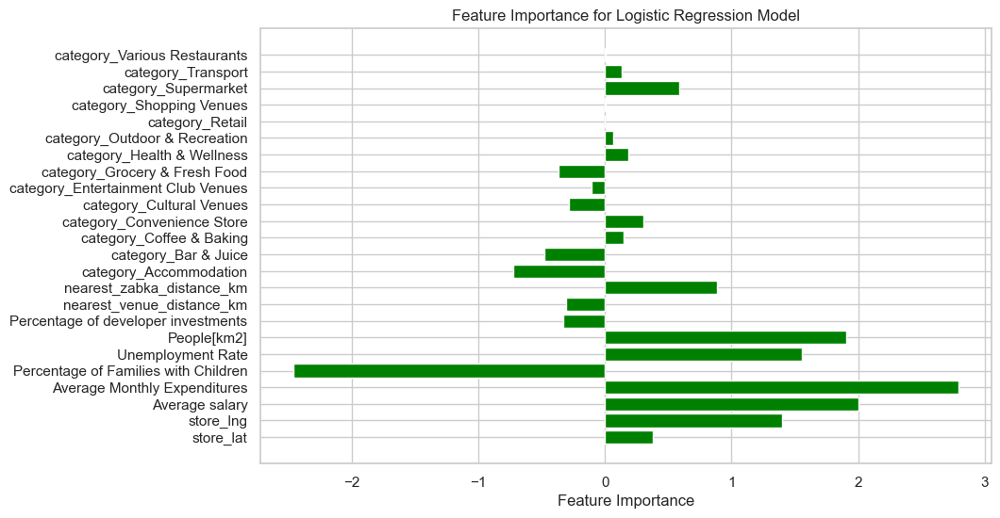

                                 Feature  Importance
3           Average Monthly Expenditures    2.789339
2                         Average salary    2.004805
6                            People[km2]    1.906237
5                      Unemployment Rate    1.554543
1                              store_lng    1.401250
9              nearest_zabka_distance_km    0.883295
21                  category_Supermarket    0.586398
0                              store_lat    0.379761
13            category_Convenience Store    0.301432
17            category_Health & Wellness    0.188353
12              category_Coffee & Baking    0.148358
22                    category_Transport    0.135881
18         category_Outdoor & Recreation    0.062642
20              category_Shopping Venues    0.003425
23          category_Various Restaurants    0.002923
19                       category_Retail   -0.000394
15    category_Entertainment Club Venues   -0.106881
14              category_Cultural Venues   -0.

In [97]:


# Step 1: Selecting variables for the model
X = final_df[['store_lat', 'store_lng', 'Average salary', 'Average Monthly Expenditures', 
               'Percentage of Families with Children', 'Unemployment Rate', 'People[km2]', 
               'Percentage of developer investments', 'nearest_venue_distance_km', 
               'nearest_zabka_distance_km', 'category_Accommodation', 'category_Bar & Juice', 
               'category_Coffee & Baking', 'category_Convenience Store', 'category_Cultural Venues', 
               'category_Entertainment Club Venues', 'category_Grocery & Fresh Food', 
               'category_Health & Wellness', 'category_Outdoor & Recreation', 
               'category_Retail', 'category_Shopping Venues', 'category_Supermarket', 
               'category_Transport', 'category_Various Restaurants']]

y = final_df['Profitability Label']

# Step 2: Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Normalizing the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Creating and training the Logistic Regression model
model = LogisticRegression(max_iter=1000, random_state=42)
model.fit(X_train_scaled, y_train)

# Step 5: Making predictions and evaluating the model
y_pred = model.predict(X_test_scaled)

# Displaying the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# Step 6: Calculating feature importance (using coefficients)
importance = model.coef_[0]

# Step 7: Visualizing feature importance
plt.figure(figsize=(10, 6))
plt.barh(X.columns, importance, color='green', align='center')  # Set bar color to green
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Logistic Regression Model')
plt.show()

# Step 8: Displaying feature importance
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
print(importance_df.sort_values(by='Importance', ascending=False))




<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">15. Conclusions based on overall analysis</span>
</div>


<div style="background-color: #f9f9f9; padding: 15px; border-radius: 5px; font-family: Arial, sans-serif; color: #333;">
  
The results of the feature analysis indicate key factors that Żabka should consider when planning new locations. First and foremost, it is advisable to focus on areas with high average expenditures and salaries, which suggests that stores should be opened in affluent areas, such as downtown Warsaw, where customers are more inclined to shop at convenience stores. Areas with high population density, such as Wola and Praga Północ, also represent promising locations as they provide a steady flow of potential customers.

Locations in areas with a high percentage of families with children should be avoided, as they prefer supermarkets due to a wider assortment and attractive promotions, which limits the number of customers in smaller stores. Furthermore, shopping centers may pose serious competition, indicating that new Żabka stores should not be placed in their immediate vicinity. Nevertheless, in areas with higher unemployment, customers often choose to shop at convenience stores, as they offer easy access to alcohol and small purchases, which is beneficial for those looking to manage their expenses.

It is also important to consider factors related to public transport accessibility, as locations well-connected to other parts of the city will be more attractive to customers. Developer investments in a given area may indicate future population growth; therefore, it is worthwhile to study regions where new investments are planned, even if there is currently little traffic. Żabka should consider opening new locations in areas with planned infrastructure development, ensuring future customer influx.

Additionally, the growing health awareness among society may attract customers to stores offering healthy products. Conversely, the presence of competitive grocery stores, as well as bars and cafes, may deter the planning of new locations, so these aspects must be carefully analyzed. Regular assessment of changes in the local market and adjusting strategies for opening new Żabka stores based on market analysis results will be crucial for the further development of the chain.

</div>



<div style="background-color: #F9F9F9; padding: 20px; border-radius: 5px; text-align: center;">

# <span style="color: #757575; font-size: 23px;">16. Do you know where to place your Zabka now?</span>
</div>


In [98]:


# Create the question and buttons
question = widgets.Label("Do you know where to place your Żabka now?")
yes_button = widgets.Button(description="Yes")
no_button = widgets.Button(description="No")

# Create output area
output = widgets.Output()

# Define the button click handlers
def on_yes_clicked(b):
    with output:
        output.clear_output()
        print("See you in Żabka soon!")

def on_no_clicked(b):
    with output:
        output.clear_output()
        print("There is an option for model improvements, try it!")

# Attach click handlers to buttons
yes_button.on_click(on_yes_clicked)
no_button.on_click(on_no_clicked)

# Display the widgets
display(question, yes_button, no_button, output)


Label(value='Do you know where to place your Żabka now?')

Button(description='Yes', style=ButtonStyle())

Button(description='No', style=ButtonStyle())

Output()